In [1]:
from IPython.display import HTML
import time

handle = display(HTML("""<marquee>👌</marquee>"""), display_id='html_marquee1')
time.sleep(2)
handle = display(HTML("""<marquee>~ “I fly because it releases my mind from the tyranny of petty things.” – Antoine de Saint-Exupery</marquee>"""), display_id='html_marquee1', update=True)

# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">Executive Summary</div>

<div class="alert alert-block alert-info"> 📌 <b>Summary</b>: This notebook is intended to 
<ul>
    <li>Provide the EDA on the Airflight Reviews dataset</li>
    <li>Identify the factors leading to high and low review rates for certain airlines</li>
    <li>Perform the time series analysis of the review data for a selective subset of airlines</li>
    <li>Perform the sentiment analysis of the review data for a selective subset of airlines</li>
</ul></div>

<div class="alert alert-block alert-success"> 🧰 <b>Key highlights</b>:
    <ul>
        <li>75% of reviews have <i>Overall_Rating less then 5</i> (quite low ratings, IMHO)</li>
        <li>The majority of the reviews has <i>Recommended = 'no'</i> flag set</li>
        <li>Passengers with Business Class and First class set higher review scores vs. the passengers who travelled by Economy or Premium Economy classes</li>
        <li>Solo Business and Solo Leisure passengers set higher reviews</li>
        <li><i>Value For Money</i> is the strongerst driver toward <i>Overall_Rating</i></li>
        <li><i>Value For Money</i> is highly correlated with grades for <i>Seat Comfort, Cabin Staff Service, Food and Beverages</i>, and <i>Ground Service</i> (although the bivariate pair correlation of the latter features with <i>Overall_Rating</i> is not detected)</li>
        <li>The majority of the reviews have the positive sentiment, quite uncorrelated/unassociated with the <i>Overall_Rating</i> score and the value of <i>Recommended</i> flag</li>
        <li><i>sentiment_score</i> of the reviews is quite correlated with the scores for <i>Value For Money</i> and <i>Ground Service</i></li>
        <li>The strong effects of the Covid-19 lockdowns can be observed if the review dates are put on the timeline</li>
        <li>The strong effects of Low Cost airlines to start the market expansion (in certain regions) in 2012, with global pre-domination of Low Cost airlines achieved by late 2016-early 2017, are noted</li>
    </ul>
</div> 

At the same time, the number of insights derived from the airlines review data are confusive and counter-intuitive. A few examples of this sort are listed below,

- The total amount of confusive reviews (the reviews with positive sentiment having the status of *Recommended = 'no'* or reviews with the negative sentiment having the status *Recommended = 'yes'*) exceeds *25%* of the records in the dataset
- *1* to be the most popular *Overall_Rating* value for both non-recommended and recommended reviews (the latter could be the clear effect of the confusive questionnaire itself)
- The numeric overall rating score and the numeric scores for individual service components (Ground Services, Cabin Crew Services, Food and Beverages etc.) do not display any strong correlation.
- The numeric overall rating score and the sentiment score do not manifest any strong correlation
- etc.

We can conclude the confusing structure of the questionnaire resulted in somewhat screwed responses from the fraction of the users who submitted their flight experience reviews.

In [2]:
import pandas as pd
import numpy as np
import datetime as dt

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.offline

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">About the Data</div>

The airline reviews dataset is collected from the website: https://www.airlinequality.com/review-pages/a-z-airline-reviews/

It is available for analysis and exploration at: https://www.kaggle.com/datasets/juhibhojani/airline-reviews

The methodology of its collection, along with the master copy of the data itself, is published in https://github.com/Juhibhojani/Airline-Reviews-

The features in the dataset are listed below

- Airline Name
- Overall Rating
- Review Title
- Review Date
- Verified (whether the review is verified or not)
- Review
- Aircraft
- Type of Traveller
- Seat Type
- Route
- Date Flown
- Seat Comfort
- Cabin Staff Service
- Food & Beverages
- Ground Service
- Inflight Entertainment
- Wifi & Connectivity
- Value for Money
- Recommended

This dataset holds a wealth of information that can be leveraged to gain valuable insights into customer experiences with various airlines. By performing sentiment analysis, time series analysis, and EDA, we are going to uncover hidden patterns, understand passenger sentiments, and make data-driven decisions to enhance the overall airline experience.

<div class="alert alert-block alert-info"> 🚩 <b>Note</b>: From the sociological stand-point, there are methodological issues in a way the review questionnaire form on the <a href="https://www.airlinequality.com/" target="_blank">AirlineQuality website</a> is put together. The problem is, the same phenomenon (overall satisfaction with the flight experience) is measured in three parallel dimensions, on different scale, as follows
    <ul>
        <li><i>Recommended</i> status measured on the binary 'yes/no' scale</li>
        <li><i>Overall Rating</i> score for the flight measured on the numeric scale of 1..9</li>
        <li>Individual quality parameters (<i>Seat Comfort, Cabin Staff Service, Food and Beverages, Ground Service, Inflight Entertainment, Wifi and Connectivity, and Value for Money</i>) are measured on the uncorrelated 1..5 scale</li>
    </ul>
    <br>It resulted in some users to provide the confusive review inputs (for instance, quite low Overall Rating while still recommending the airlines flight and vise the versa). We are going to specially indicate such a confusive user input on the occasions down the road. At this point, we can conclude the confusing structure of the questionnaire resulted in somewhat screwed responses from the fraction of the users who submitted their flight experience reviews.
</div>

# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">Reading Data</div>

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Initial Data Inspection</div>

In [3]:
run_locally = False
if run_locally:
    dataset_path = './Airline_review.csv'
else:
    dataset_path = '../input/airline-reviews/Airline_review.csv'
    
df = pd.read_csv(dataset_path, index_col=0)
df.head()

,Airline Name,Overall_Rating,Review_Title,Review Date,Verified,Review,Aircraft,Type Of Traveller,Seat Type,Route,Date Flown,Seat Comfort,Cabin Staff Service,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money,Recommended
0,AB Aviation,9,"""pretty decent airline""",11th November 2019,True,Moroni to Moheli. Turned out to be a pretty ...,NaN,Solo Leisure,Economy Class,Moroni to Moheli,November 2019,4.0,5.0,4.0,4.0,NaN,NaN,3.0,yes
1,AB Aviation,1,"""Not a good airline""",25th June 2019,True,Moroni to Anjouan. It is a very small airline...,E120,Solo Leisure,Economy Class,Moroni to Anjouan,June 2019,2.0,2.0,1.0,1.0,NaN,NaN,2.0,no
2,AB Aviation,1,"""flight was fortunately short""",25th June 2019,True,Anjouan to Dzaoudzi. A very small airline an...,Embraer E120,Solo Leisure,Economy Class,Anjouan to Dzaoudzi,June 2019,2.0,1.0,1.0,1.0,NaN,NaN,2.0,no
3,Adria Airways,1,"""I will never fly again with Adria""",28th September 2019,False,Please do a favor yourself and do not fly wi...,NaN,Solo Leisure,Economy Class,Frankfurt to Pristina,September 2019,1.0,1.0,NaN,1.0,NaN,NaN,1.0,no
4,Adria Airways,1,"""it ruined our last days of holidays""",24th September 2019,True,Do not book a flight with this airline! My fr...,NaN,Couple Leisure,Economy Class,Sofia to Amsterdam via Ljubljana,September 2019,1.0,1.0,1.0,1.0,1.0,1.0,1.0,no


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23171 entries, 0 to 23170
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Airline Name            23171 non-null  object 
 1   Overall_Rating          23171 non-null  object 
 2   Review_Title            23171 non-null  object 
 3   Review Date             23171 non-null  object 
 4   Verified                23171 non-null  bool   
 5   Review                  23171 non-null  object 
 6   Aircraft                7129 non-null   object 
 7   Type Of Traveller       19433 non-null  object 
 8   Seat Type               22075 non-null  object 
 9   Route                   19343 non-null  object 
 10  Date Flown              19417 non-null  object 
 11  Seat Comfort            19016 non-null  float64
 12  Cabin Staff Service     18911 non-null  float64
 13  Food & Beverages        14500 non-null  float64
 14  Ground Service          18378 non-null

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Missing Values Review</div>

Let's review the spread of the missing values in the train dataset

In [5]:
for col in df.columns:
    msg = 'column: {:>10}\t Percent of NaN value: {:.2f}%'.format(col,100*(df[col].isnull().sum()/df[col].shape[0]))
    print(msg)

column: Airline Name	 Percent of NaN value: 0.00%
column: Overall_Rating	 Percent of NaN value: 0.00%
column: Review_Title	 Percent of NaN value: 0.00%
column: Review Date	 Percent of NaN value: 0.00%
column:   Verified	 Percent of NaN value: 0.00%
column:     Review	 Percent of NaN value: 0.00%
column:   Aircraft	 Percent of NaN value: 69.23%
column: Type Of Traveller	 Percent of NaN value: 16.13%
column:  Seat Type	 Percent of NaN value: 4.73%
column:      Route	 Percent of NaN value: 16.52%
column: Date Flown	 Percent of NaN value: 16.20%
column: Seat Comfort	 Percent of NaN value: 17.93%
column: Cabin Staff Service	 Percent of NaN value: 18.39%
column: Food & Beverages	 Percent of NaN value: 37.42%
column: Ground Service	 Percent of NaN value: 20.69%
column: Inflight Entertainment	 Percent of NaN value: 53.26%
column: Wifi & Connectivity	 Percent of NaN value: 74.45%
column: Value For Money	 Percent of NaN value: 4.60%
column: Recommended	 Percent of NaN value: 0.00%


Now, let's visualize the missing values spread in the dataset. 

<div class="alert alert-block alert-info"> ✅ <b>Tip</b>: The good instrument to quickly visualize the missing values in a dataset is the specialized library - <i><b>missingno</b></i>. We are going to demonstrate it below.
</div>

First of all, we will look at the ratio of the missing values as a bar chart

<Axes: >

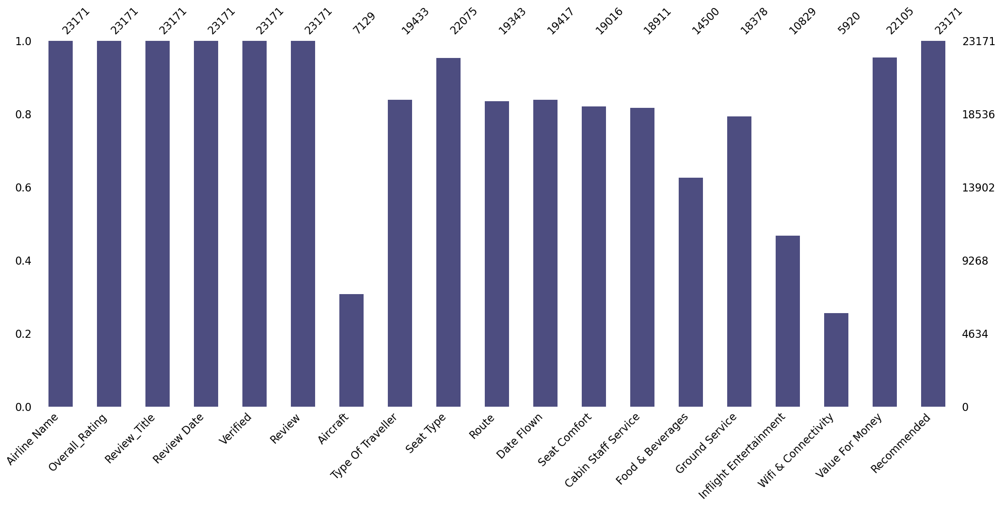

In [6]:
import missingno as msno

msno.bar(df, color=(0.3,0.3,0.5))

Now we are going to look at the actual records affected in the matrix view

<Axes: >

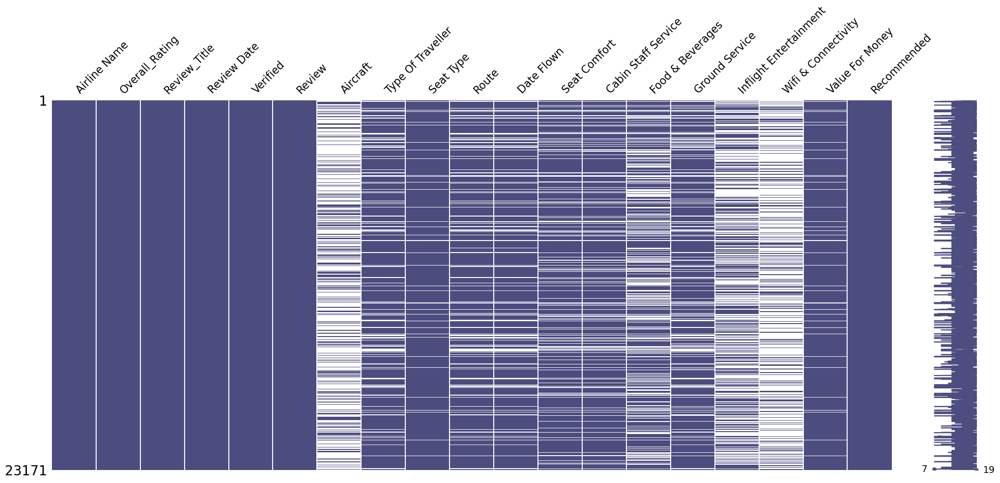

In [7]:
msno.matrix(df, color=(0.3,0.3,0.5))

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Data Inspection Summary</div>

We can see from the quick data instpection that
- *Aircraft, Inflight Entertainment, Wifi & Connectivity* features have more then 50% of missing values
- *Value for Money* and *Seat Type* features, having less then 5% of NaN values, can be imputed with the median values down the road
- *Review Date* should be conterted to datetime and then further decomposed on the TS-style features (day, week, month, year, dayofweek etc.) to enable the time series analysis down the road
- Quality of data in *Date Flown* should be extensively scrutinized to either prove or negate the assumption that the  missing values from Date Flown could be mapped from *Review Date*
- *Overall_Rating* feature should be converted to numeric type in order to enable manipulating with the average rating charts
- Before we convert *Overall_Rating* to a numeric variable, we should replace the non-numeric category value ('n') with the most frequent value of the numeric rating

<div class="alert alert-block alert-info"> ✅ <b>Note</b>: Since this notebook is focused on EDA only, we will still do various multi-variate analysis activities for the  features with significant NaN ratios. However, we will be using a subset of the total dataset with relevant values in the flight review (the entire size of the dataset is quite  big so we are going to get the relevant subsamples for the analytics to make sense).
</div>

# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">Data Imputation and Feature Engineering</div>

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Handling Overall_Rating = 'n'</div>

We basically have two options with respect to handling the records with *Overall_Rating = 'n'* (not provided)

- (1) we can drop these records, subject to them not being the large chunk of the dataset and having other features poorly covered, or
- (2) we can impute 'n' with the relevant rating values 

First of all, let's do the univariate analaysis to see the distribution of records by categories of *Overall_Rating*

In [8]:
dfg = df['Overall_Rating'].value_counts().reset_index()
dfg.columns = ['Overall_Rating', 'Quantity']
fig = px.bar(dfg, x='Overall_Rating', y='Quantity', 
             title='Quantity of Airline Reviews by Overall Rating',
            color_discrete_sequence=px.colors.qualitative.Prism) 
fig.show()

As we can see, the quantity of the records *Overall_Rating = 'n'* is not significant (842 records out of 23171 - less then 4%), and we can theoretically do the imputation of 'n' with the  most frequent rating value (that is, *'1'*). Before we make a final call on it, let's review the sparcity of missing values in the records with *Overall_Rating = 'n'*

In [9]:
df_n = df[df["Overall_Rating"] == 'n']

for col in df_n.columns:
    msg = 'column: {:>10}\t Percent of NaN value: {:.2f}%'.format(col,100*(df_n[col].isnull().sum()/df_n[col].shape[0]))
    print(msg)

column: Airline Name	 Percent of NaN value: 0.00%
column: Overall_Rating	 Percent of NaN value: 0.00%
column: Review_Title	 Percent of NaN value: 0.00%
column: Review Date	 Percent of NaN value: 0.00%
column:   Verified	 Percent of NaN value: 0.00%
column:     Review	 Percent of NaN value: 0.00%
column:   Aircraft	 Percent of NaN value: 100.00%
column: Type Of Traveller	 Percent of NaN value: 100.00%
column:  Seat Type	 Percent of NaN value: 62.71%
column:      Route	 Percent of NaN value: 100.00%
column: Date Flown	 Percent of NaN value: 100.00%
column: Seat Comfort	 Percent of NaN value: 78.98%
column: Cabin Staff Service	 Percent of NaN value: 78.98%
column: Food & Beverages	 Percent of NaN value: 78.98%
column: Ground Service	 Percent of NaN value: 100.00%
column: Inflight Entertainment	 Percent of NaN value: 79.10%
column: Wifi & Connectivity	 Percent of NaN value: 100.00%
column: Value For Money	 Percent of NaN value: 62.35%
column: Recommended	 Percent of NaN value: 0.00%


<Axes: >

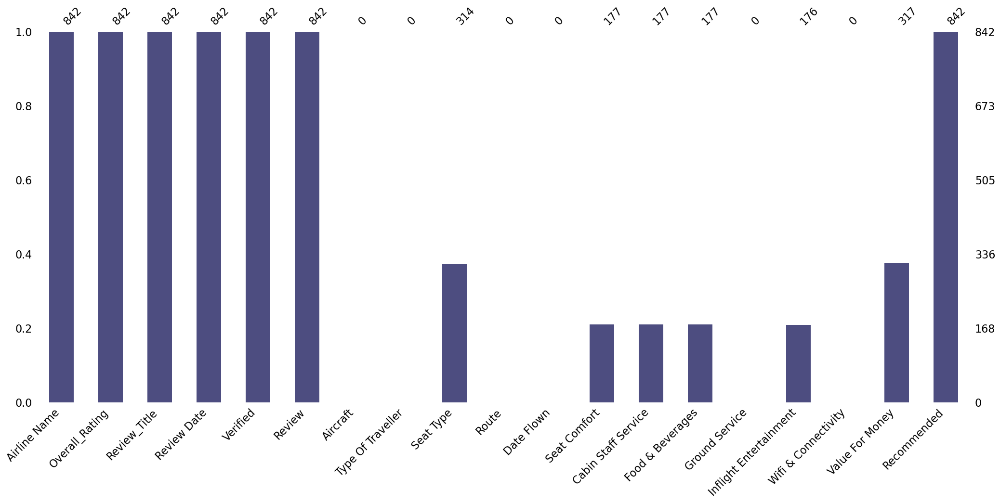

In [10]:
msno.bar(df_n, color=(0.3,0.3,0.5))

<Axes: >

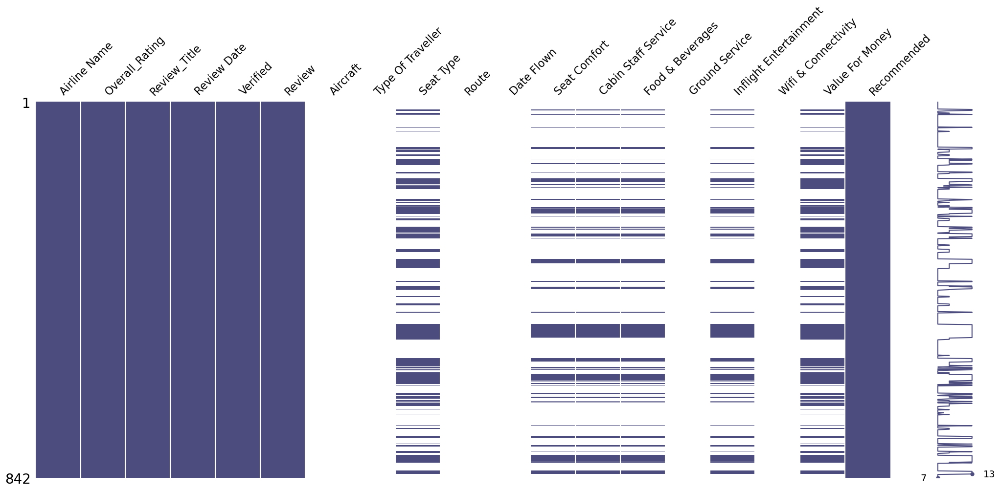

In [11]:
msno.matrix(df_n, color=(0.3,0.3,0.5))

As we can see, the amout of missing values in other columns of the records with *Overall_Rating = 'n'* is much higher vs. the entire dataset.

However, since *Review_Title*, *Review*, and *Recommended* are still populated for these records, we will retain them for the purpose of performing the sentiment analysis down the road. 

*Recommended* feature, being essentially a binary yes/no category, has certain relation to *Overall_Rating*. The simple intuition tells us that
- *Overall_Rating* must be quite low for the records with *Recommended = 'no'*
- *Overall_Rating* must be quite high for the records with *Recommended = 'yes'*

Let's review the counts of the records with *Overall_Rating = 'n'* by *Recommended* categories

In [12]:
dfg = df_n['Recommended'].value_counts().reset_index()
dfg.columns = ['Recommended', 'Quantity']
fig = px.bar(dfg, x='Recommended', y='Quantity', 
             title='Quantity of Airline Reviews without rating by Recommended Flag',
            color_discrete_sequence=px.colors.qualitative.Prism) 
fig.show()

We find that
- the majority of the records are with *Recommended = 'no'*
- the optimal imputation strategy *Overall_Rating = 'n'* can be the imputation with the most frequent numeric rating values by *Recommended* categories

Let's find out the most frequent numeric rating values for different *Recommended* categories.

In [13]:
agg_data = df.groupby(['Overall_Rating', 'Recommended']).size().reset_index(name='Review_count')

agg_data = agg_data.sort_values(by=["Overall_Rating", "Review_count"])

fig = px.bar(
    agg_data, 
    x='Recommended', 
    y='Review_count', 
    color='Overall_Rating', 
    title="Reviews by Recommended Flag and Overall Rating", 
    color_discrete_sequence=px.colors.qualitative.Prism,
    height=600)
fig.show()

We find that *'1'* is the most frequent value for the reviews with both *Recommended = 'yes'* and *Recommended = 'no'*. Therefore, we are going to impute *Overall_Rating = 'n'* with '1'.

Once we impute *Overall_Rating = 'n'* with '1', we will convert *Overall_Rating* to the numeric type.

<div class="alert alert-block alert-info"> ✅ <b>Note</b>: Overall, seeing <i>'1'</i> to be the most frequent value for the reviews with <i>Recommended = 'yes'</i> is quite counter-intuitive. The naive logic/intuition assumes it to be closer to the upper-level ratings (either <i>'8'</i> or <i>'9'</i>). Such a phenomenon highlights several possible fundamental issues
    <ul>
        <li>the hidden subjectivism in a way people rank their flight experience</li>
        <li>the confusion of the part of the users as for working the online questionnaire to rank their flight experience (as it has the overall flight review on 1..9 scale, individual flight experience componentst to be ranked on 1..5 scale, and the recommend-to-others flag on the binary Yes/No scale</li>
    </ul><br><br>
    As a part of the advanced drills below, it would be interesting to investigate the reviews with <i>Recommended = 'yes'</i> flag attributing the low rating scores deeper.
</div>

In [14]:
# implement mapping 'n' in Overall_Rating 
def map_n_rating(x):
    res = x
    if x == 'n':
        res = '1'

    return res

df["Overall_Rating"] = df["Overall_Rating"].apply(map_n_rating)


We can also see a bunch of interesting observations regarding the relation between *Recommended* and *Overall_Rating*
- 75% of reviews have *Overall_Rating* <=5 (quitte low ratings, IMHO)
- within the reviews with *Recommended = 'no'*, there is a minor fraction of reviews with quite high ratings (6-8); it  would be interesting to look at these 'deviant' reviews in more details down the road
- within the reviews with *Recommended = 'yes'*, there is a minor fraction of reviews with quite low rating (1-5); it  would be interesting to look at these 'deviant' reviews in more details down the road

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Handling missing values in Value For Money</div>

Let's impute the missing values with the median values by Overall_Rating categories.

In [15]:
fig = px.violin(df, y="Value For Money", x="Overall_Rating", 
                box=True,  
                title="Value for Money by Overall Rating", 
                color_discrete_sequence=px.colors.qualitative.Prism,
                hover_data=['Airline Name'])
fig.show()

We find that
- median values for *Overall_Rating = 1..2* is *1*
- median values for *Overall_Rating = 3..4* is *2*
- median values for *Overall_Rating = 5* is *3*
- median values for *Overall_Rating = 6..8* is *4*
- median values for *Overall_Rating = 9* is *5*

The findings above will help us to properly map the missing values for *Value For Money*

Additionally, we detected the 'outlier' airlines that stand out of the stat ranges of *Value For Money* for each of the *Overall_Rating* ranks. These are

- Airlines that had reviews with Overall_Rating = 9 and low Value For Money (SilkAir, SkyWest Airlines, Sky Airlines)
- Airlines that had reviews with Overall_Rating = 8 and low Value For Money (Xiamen Airlines, Uzbekistan Airways, Utair Aviation)
- Airlines that had reviews with Overall_Rating = 7 and low Value For Money (VLM Airlines,TAME)
- Airlines that had reviews with Overall_Rating = 6 and low Value For Money (TunisAir, Regional Express)
- Airlines that had reviews with Overall_Rating = 4 and high Value For Money (Rwandair)
- Airlines that had reviews with Overall_Rating = 1 and high Value For Money (XL Airways France, ZIPAIR)


In [16]:
value_for_money_median_map = {
    "1": 1, 
    "2": 1,
    "3": 2,
    "4": 2,
    "5": 3,
    "6": 4,
    "7": 4,
    "8": 4,
    "9": 5,
}

df['Median_value_for_money'] = df['Overall_Rating'].map(value_for_money_median_map)

df["Value For Money"] = df.apply(
    lambda row: row['Median_value_for_money'] if np.isnan(row["Value For Money"]) else row["Value For Money"],
    axis=1
)
df=df.drop(columns=['Median_value_for_money'])

We can see that *Value For Money* is now without missing values.

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23171 entries, 0 to 23170
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Airline Name            23171 non-null  object 
 1   Overall_Rating          23171 non-null  object 
 2   Review_Title            23171 non-null  object 
 3   Review Date             23171 non-null  object 
 4   Verified                23171 non-null  bool   
 5   Review                  23171 non-null  object 
 6   Aircraft                7129 non-null   object 
 7   Type Of Traveller       19433 non-null  object 
 8   Seat Type               22075 non-null  object 
 9   Route                   19343 non-null  object 
 10  Date Flown              19417 non-null  object 
 11  Seat Comfort            19016 non-null  float64
 12  Cabin Staff Service     18911 non-null  float64
 13  Food & Beverages        14500 non-null  float64
 14  Ground Service          18378 non-null

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Handling Missing Values in Seat Type</div>

Let's impute the missing values with the most frequent value of Seat Type.

In [18]:
dfg = df['Seat Type'].value_counts().reset_index()
dfg.columns = ['Seat Type', 'Quantity']
fig = px.bar(dfg, x='Seat Type', y='Quantity', 
             title='Quantity of Airline Reviews by Seat Types',
            color_discrete_sequence=px.colors.qualitative.Prism) 
fig.show()

We can see that Ecomony Class is the most frequent type of seats observed in the reviews dataset. Therefore, we can replace NaN with 'Economy Class'.

In [19]:
df['Seat Type'] = df['Seat Type'].fillna('Economy Class')

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Assessing Date and Time Features</div>

First of all, we are going to create two new features (*review_datetime* and *flight_datetime*, correspondingly) to represent original values from *Review Date* and *Date Flown* as datetime values.

In [20]:
df['review_datetime'] = pd.to_datetime(df['Review Date'])
df['flight_datetime'] = pd.to_datetime(df['Date Flown'])


After that, we can calculate the difference between *review_datetime* and *flight_datetime*. It will be stored as a new feature - *flight_review_month_diff*

<div class="alert alert-block alert-info"> 🔅 <b>Note</b>: The difference will be calculated in days.
</div>

In [21]:
df['flight_review_month_diff'] = df.apply(lambda r: (r['review_datetime'] - r['flight_datetime']).days,
                                                       axis=1)

After we obtain the values of *flight_review_month_diff*, we can further access the quality of the data inputs in *Flown Date* feature to see if
- if we can use it in the EDA at all
- if we can impute the missing values for it with the info from *Review Date*

We can use the general intuition below
- review date should be in the past relative to the flight date (since a typical passenger writes a review after the flight completed)
- we can consider the hypothesis to be able to impute the missing values for *Flown Date* with the info from *Review Date* only if we find the majority of present records to have both *Flown Date* and *Review Date* to be dated by the same month (in fact, the input for *Flown Date* holds the month and year of the flight only).

First of all, let's check the blatant data input errors where *flight_review_month_diff* is negative (review date is in the past vs. the date of the flight)

In [22]:
deviants = df[df['flight_review_month_diff'] < 0]
print("Number of records with the error input of Flown Date:", deviants.shape[0])

Number of records with the error input of Flown Date: 7


Now, let's check how many records have the review date to be in the far future vs. the date of the flight (that is, the review to be published after more then a month since the actual flight date)

In [23]:
deviants = df[df['flight_review_month_diff'] > 30]
print("Number of records with the review date to be in distant future vs. Flown Date:", deviants.shape[0])

Number of records with the review date to be in distant future vs. Flown Date: 5733


As discovered above, we can see the following picture as for the quality of data in *Date Flown* column
- *16.2%* of the records in the original dataset have missing values
- out of *19417* records with data input to *Date Flown*, we see *5733* records (*29.53%* of records with values) where *Review Date* is more then one month ahead of *Date Flown*
- out of *19417* records with data input to *Date Flown*, we identified *7* records with the blantant data input issues

Based on the insights above, we cannot afford to impute the missing values for *Date Flown* with the values from *Review Date*. Moreover, we can conclude on the quality of the data inputs for *Date Flown* to be poor as well as disqualify this feature for futher analysis.

Before we go on with the further EDA efforts, let's clean up our dataset from
- the original *Review Date* and *Date Flown* columns
- some of the columns we created on a fly with the date-related data validations above (it will affect *flight_datetime* and *flight_review_month_diff*, correspondingly)

In [24]:
df.drop(['Review Date', 'Date Flown', 'flight_datetime', 'flight_review_month_diff'], axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23171 entries, 0 to 23170
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Airline Name            23171 non-null  object        
 1   Overall_Rating          23171 non-null  object        
 2   Review_Title            23171 non-null  object        
 3   Verified                23171 non-null  bool          
 4   Review                  23171 non-null  object        
 5   Aircraft                7129 non-null   object        
 6   Type Of Traveller       19433 non-null  object        
 7   Seat Type               23171 non-null  object        
 8   Route                   19343 non-null  object        
 9   Seat Comfort            19016 non-null  float64       
 10  Cabin Staff Service     18911 non-null  float64       
 11  Food & Beverages        14500 non-null  float64       
 12  Ground Service          18378 non-null  float6

# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">Express EDA Of Categorical Feature Variables</div>

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Univariate Analysis of Categorical Features</div>

Let's review the distribution of reviews by categories of each of the category variables.

### Overall Rating

In [25]:
dfg = df['Overall_Rating'].value_counts().reset_index()
dfg.columns = ['Overall_Rating', 'Quantity']
fig = px.bar(dfg, x='Overall_Rating', y='Quantity', 
             title='Quantity of Airline Reviews by Overall Rating',
            color_discrete_sequence=px.colors.qualitative.Prism) 
fig.show()

In [26]:
df_agg = df.groupby("Overall_Rating").mean(numeric_only=True).reset_index()
df_agg

,Overall_Rating,Verified,Seat Comfort,Cabin Staff Service,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money
0,1,0.574415,2.191696,2.347275,2.210402,1.851778,1.930590,1.589404,1.807831
1,2,0.560540,2.081395,2.284395,1.812698,1.583208,1.703493,1.482804,1.656359
2,3,0.526549,2.411715,2.666383,1.995807,2.040431,1.980822,1.679587,2.062684
3,4,0.448196,2.550376,2.837594,2.174863,2.386838,2.021951,1.728261,2.412107
4,5,0.377108,2.785150,3.189873,2.455210,2.784029,2.195704,1.960265,3.001205
5,6,0.468148,3.076531,3.425170,2.848907,3.214015,2.438889,2.250000,3.518519
6,7,0.453479,3.487619,3.892381,3.160521,3.609323,2.589905,2.506410,3.849120
7,8,0.434832,3.853723,4.335548,3.657295,4.056967,2.871379,2.832000,4.163916
8,9,0.485294,4.206919,4.672977,4.134373,4.421206,3.440044,3.531250,4.453620


We find that
- the most reviews hold Overall Rating equal to 1, with 2 being the second most popular review score
- 9 and 8 take the third and fourth places in the number of ratings, respectively
- less then 75% of reviews have the overall rating greater then 5, overall
- Reviews with low overall rating have a bigger fraction of verified reviews vs. the reviews with overall rating of 8-9
- we can see the statistically significant difference in the distribution of numeric variables by the categories of *Overall_Rating*,  therefore it will make sense to do more detailed drill into low- and  high-ranked reviews 

### Seat Type

In [27]:
dfg = df['Seat Type'].value_counts().reset_index()
dfg.columns = ['Seat Type', 'Quantity']
fig = px.bar(dfg, x='Seat Type', y='Quantity', 
             title='Quantity of Airline Reviews by Seat Types',
            color_discrete_sequence=px.colors.qualitative.Prism) 
fig.show()

In [28]:
df_agg = df.groupby("Seat Type").mean(numeric_only=True).reset_index()
df_agg

,Seat Type,Verified,Seat Comfort,Cabin Staff Service,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money
0,Business Class,0.596282,3.356250,3.613340,3.208696,3.041196,2.849759,2.500785,3.109152
1,Economy Class,0.522603,2.517023,2.772057,2.440982,2.263052,2.047894,1.655026,2.324984
2,First Class,0.591398,3.494318,3.755682,3.213415,3.212121,2.606838,2.721519,3.241935
3,Premium Economy,0.592879,2.749596,2.925687,2.619048,2.481667,2.494172,2.132000,2.504644


We can find that
- the most reviews go for the flights in Economy Class (20241 reviews)
- Business Class takes the second place (2098 reviews)
- There is a significant difference in distribution of numeric features fy observations with the different Seat Type categories

### Type Of Traveller

In [29]:
dfg = df['Type Of Traveller'].value_counts().reset_index()
dfg.columns = ['Type Of Traveller', 'Quantity']
fig = px.bar(dfg, x='Type Of Traveller', y='Quantity', 
             title='Quantity of Airline Reviews by Type of Traveller',
            color_discrete_sequence=px.colors.qualitative.Prism) 
fig.show()

In [30]:
df_agg = df.groupby("Type Of Traveller").mean(numeric_only=True).reset_index()
df_agg

,Type Of Traveller,Verified,Seat Comfort,Cabin Staff Service,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money
0,Business,0.664688,2.657968,2.918951,2.566650,2.365237,2.296784,1.851628,2.389837
1,Couple Leisure,0.594872,2.474690,2.758402,2.444189,2.253277,2.188259,1.707193,2.274074
2,Family Leisure,0.587546,2.478026,2.705776,2.442361,2.218842,2.263556,1.762129,2.229779
3,Solo Leisure,0.679775,2.728669,2.996102,2.715451,2.505576,2.383752,1.821218,2.521067


We find that
- Type of Traveller has a significant fraction of missing values 
- Within the subsect of the records with Type of Traveller specified, the biggest fraction of reviews goes from Solo Leisure travellers (7120 reviews)
- Couple Leisure takes the second place (5265 reviews)
- There is a significant difference in distribution of numeric features fy observations with the different Type of Traveller categories

### Recommended Flag

In [31]:
dfg = df['Recommended'].value_counts().reset_index()
dfg.columns = ['Recommended', 'Quantity']
fig = px.bar(dfg, x='Recommended', y='Quantity', 
             title='Quantity of Airline Reviews by Recommended Flag',
            color_discrete_sequence=px.colors.qualitative.Prism) 
fig.show()

In [32]:
df_agg = df.groupby("Recommended").mean(numeric_only=True).reset_index()
df_agg

,Recommended,Verified,Seat Comfort,Cabin Staff Service,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money
0,no,0.557863,1.840089,2.004811,1.656713,1.456827,1.578194,1.314367,1.468172
1,yes,0.480466,3.999708,4.396061,3.850852,4.173727,3.210183,3.384096,4.258614


We find that

- The majority of the reviews are submitted with *Recommended = 'no'* (15364 out of 23171 reviews in the dataset, or 66.31% of the entire dataset); it indicates the majority of the reviewers are less than satisfied with the services provided by the airlines
- There is a significant difference in distribution of numeric features fy observations with the different Recommended status categories (numeric rankings for individual services are higher for the reviews with *Recommended = 'yes'*)
- The ratio of verified reviews is higher for the reviews with *Recommended = 'no'*

### Verified Flag

In [33]:
dfg = df['Verified'].value_counts().reset_index()
dfg.columns = ['Verified', 'Quantity']
fig = px.bar(dfg, x='Verified', y='Quantity', 
             title='Quantity of Airline Reviews by Verified Flag',
            color_discrete_sequence=px.colors.qualitative.Prism) 
fig.show()

In [34]:
df_agg = df.groupby("Verified").mean(numeric_only=True).reset_index()
df_agg

,Verified,Seat Comfort,Cabin Staff Service,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money
0,False,2.636926,2.888720,2.531932,2.376441,1.962347,1.722967,2.485943
1,True,2.605121,2.859311,2.570345,2.340510,2.348642,1.811749,2.340042


We find that

- The larger fraction of reviews in the dataset is verified (namely, 12322 out of 23171 reviews, or 53.18% of the records in the dataset)
- There is a significant difference in distribution of numeric features fy observations with the different Verified status categories

### Aircraft

In [35]:
dfg = df['Aircraft'].value_counts().reset_index()
dfg.columns = ['Aircraft', 'Quantity']
fig = px.bar(dfg, x='Aircraft', y='Quantity', 
             title='Quantity of Airline Reviews by Aircraft',
             #orientation='h',
            color_discrete_sequence=px.colors.qualitative.Prism) 
fig.show()

In [36]:
fig = px.histogram(dfg, x="Quantity", marginal="rug",
                   title='Distribution of Review Number by Aircraft',
                   color_discrete_sequence=px.colors.qualitative.Prism)
fig.show()

We find that

- the Aircraft feature is quite noisy (a big fraction of NaN values, as identified above; a lot of variations in writing down the same aircraft names etdc.)
- only a few Aircrafts have enough observations (reviews) in the dataset to be eligible for the in-depth statistical analysis and EDA

Also, the common logic of the Airlines industry tells there is no way passengers can choose an aircraft once they decide to fly with a certain company on a certain route. Typically, the airline companies decide which aircraft is going to serve a particular flight.

In the evidence of the mentioned above, we are not going to use *Aircraft* feature in the advanced EDA and data mining efforts below.

### Airline Name

In [37]:
dfg = df['Airline Name'].value_counts().reset_index()
dfg.columns = ['Airline Name', 'Quantity']
fig = px.bar(dfg, x='Airline Name', y='Quantity', 
             title='Quantity of Airline Reviews by Airline Names',
             #orientation='h',
            color_discrete_sequence=px.colors.qualitative.Prism) 
fig.show()

In [38]:
fig = px.histogram(dfg, x="Quantity", marginal="rug",
                   title='Distribution of Review Number by Airline Names',
                   color_discrete_sequence=px.colors.qualitative.Prism)
fig.show()

We find that

- there are reviews for *497* distinct airlines presented in the dataset
- the maximal value of reviews per an airline is *100* (and it is featured for 155 airlines in the dataset)
- *210* airlines have less then 20 reviews per a company within the dataset; such airlines do not have a representative review sample to be qualified for individual in-depth airline studies

Overall, the use of Airlines feature in the advanced EDA and data mining is going to be productive. We will be able to

- calculate and review the summary statistics for each of the airlines within the dataset
- identify the leading airlines (in terms of the best average ratings and average value for money scores)
- identify the outsiders (in terms of the worst average ratings and average value for money scores)
- identify the airlines with notable deviations of the individual reviews from the average values

The identified airlines will be scrutinized in the individual case study chapters down the road.

<div class="alert alert-block alert-info"> 🔅 <b>Note</b>: Only the airlines with 20+ reviews per company will be 'eligible' for the in-depth case studies (see below).
</div>

### Route

In [39]:
dfg = df['Route'].value_counts().reset_index()
dfg.columns = ['Route', 'Quantity']
fig = px.histogram(dfg, x="Quantity", marginal="rug",
                   title='Distribution of Review Number by Route',
                   color_discrete_sequence=px.colors.qualitative.Prism)
fig.show()

As we can see, *Route* is a noisy feature (not to mention it has a significant fraction of *NaN* values). Therefore, we are going to skip it in the in-depth EDA and data mining efforts down the road.

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Multivariate Analysis of Categorical Features</div>

In [40]:
agg_data = df[["Seat Type", "Type Of Traveller", "Overall_Rating"]].groupby(["Seat Type", "Type Of Traveller", "Overall_Rating"]).size().reset_index(name="Count")
# define figure element
fig = px.sunburst(
    agg_data,
    values='Count',
    path=["Seat Type", "Type Of Traveller", "Overall_Rating"],
    title="Ratings by Seat Type and Type of Traveller",
    color="Overall_Rating",
    height=1000,
    color_discrete_sequence=px.colors.qualitative.Pastel,
    color_continuous_scale=px.colors.sequential.BuPu
)
# display the figure
fig.show()

We find that

- *1* is the most frequent rank set in reviews of passangers of all Seat Types and Types of Traveller
- *2* is the second most frequent rank set by passengers in *Economy class*, across all of the Types of Traveller
- In Business class, the second most frequent rank is either *8* or *9*, depending on the Type of Traveller

So, the majority of the  reviews show quite a low overall rank.

In [41]:
agg_data = df[["Seat Type", "Recommended", "Overall_Rating"]].groupby(["Seat Type", "Recommended", "Overall_Rating"]).size().reset_index(name="Count")
# define figure element
fig = px.sunburst(
    agg_data,
    values='Count',
    path=["Seat Type", "Recommended", "Overall_Rating"],
    title="Ratings by Seat Type and Recommended Status",
    color="Overall_Rating",
    height=1000,
    color_discrete_sequence=px.colors.qualitative.Pastel,
    color_continuous_scale=px.colors.sequential.BuPu
)
# display the figure
fig.show()

We find that
- passengers who travelled in *Business Class* have higher ratio of recommended reviews (that is, reviews with *Recommended = 'yes'*)
- passengers who traveled in other Seat Types have higher ration of non-recommended reviews (that is, reviews with *Recommended = 'no'*)
- for recommended reviews, the top three most popular *Overall_Rating* scores are *1, 9, and 8*
- for non-recommended reviews, the top three most popular *Overall_Rating* scores are *1, 2, and 3*

<div class="alert alert-block alert-info"> 🔅 <b>Note</b>: It is quite counter-intuitive to see <i>1</i> as the most frequent value for <i>Overall_Rating</i> of the reviews with <i>Recommended</i> status. IMHO it is yet one more argument to indicate quite a confusive structure of the Airflight review questionnaire on the <i>AirlinesQuality</i> website.
</div>

In [42]:
agg_data = df[["Seat Type", "Verified", "Overall_Rating"]].groupby(["Seat Type", "Verified", "Overall_Rating"]).size().reset_index(name="Count")
# define figure element
fig = px.sunburst(
    agg_data,
    values='Count',
    path=["Seat Type", "Verified", "Overall_Rating"],
    title="Ratings by Seat Type and Verified Status",
    color="Overall_Rating",
    height=1000,
    color_discrete_sequence=px.colors.qualitative.Pastel,
    color_continuous_scale=px.colors.sequential.BuPu
)
# display the figure
fig.show()

We find that

- the amount of *Verified* reviews is bigger than the number of *non-Verified* reviews, for each of the Seat Types
- the most frequent *Overall_Rating* score is *1*, across all of the combinations of Seat Types and Verified review status
- for verified reviews in *Economy Class*, the second and third the most popular scores of *Overall_Rating* are *2 and 9*
- for non-verified reviews in *Economy Class*, the second and third the most popular scores of *Overall_Rating* are *2 and 8*
- for verified reviews in *Business Class*, the second and third the most popular scores of *Overall_Rating* are *9 and 8*
- for non-verified reviews in *Business Class*, the second and third the most popular scores of *Overall_Rating* are *8 and 9*

In [43]:
agg_data = df[["Seat Type", "Type Of Traveller", "Recommended"]].groupby(["Seat Type", "Type Of Traveller", "Recommended"]).size().reset_index(name="Count")
# define figure element
fig = px.sunburst(
    agg_data,
    values='Count',
    path=["Seat Type", "Type Of Traveller",  "Recommended"],
    title="Recommened by Seat Type, Type of Traveller",
    color="Type Of Traveller",
    height=800,
    color_discrete_sequence=px.colors.qualitative.Prism,
    #color_continuous_scale=px.colors.sequential.Viridis
)
# display the figure
fig.show()

We find that
- users how travel for the business reasons (*Type Of Traveller = 'Business'*) leave more positive reviews vs. other types of travellers, regardless the Seat Type they fly by

In [44]:
agg_data = df[["Seat Type", "Verified", "Recommended"]].groupby(["Seat Type", "Verified", "Recommended"]).size().reset_index(name="Count")
# define figure element
fig = px.sunburst(
    agg_data,
    values='Count',
    path=["Seat Type", "Verified",   "Recommended"],
    title="Recommened by Seat Type and Verified Status",
    color="Seat Type",
    height=800,
    color_discrete_sequence=px.colors.qualitative.Prism,
    #color_continuous_scale=px.colors.sequential.Viridis
)
# display the figure
fig.show()

We find that
- the number of positive reviews (*Recommended = 'yes'*) is higher amoung verified reviews of the passengers who travelled in *Economy Class*
- for other Seat Types, there is no such an effect observed

In [45]:
agg_data = df[["Type Of Traveller", "Verified", "Recommended"]].groupby(["Type Of Traveller", "Verified", "Recommended"]).size().reset_index(name="Count")
# define figure element
fig = px.sunburst(
    agg_data,
    values='Count',
    path=["Type Of Traveller", "Verified",   "Recommended"],
    title="Recommened by Type of Traveller and Verified Status",
    color="Type Of Traveller",
    height=800,
    color_discrete_sequence=px.colors.qualitative.Prism,
    #color_continuous_scale=px.colors.sequential.Viridis
)
# display the figure
fig.show()

We find that
- for all types of the traveller, the % of recommended reviews (*Recommended = 'yes'*) is higher within the subset of non-verified reviews

# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">Express EDA Of Numeric Feature Variables</div>

First of all, we need to convert *Overall_Rating* to numeric, to enable reach analytics based on average ratings down the road.

After that, we are going to check hte summary statistics for  the numeric variables in the dataset (that is, to do the univariate EDA for the feature variables).

In [46]:
#cast Overall_Rating to numeric
df["Overall_Rating"] = pd.to_numeric(df["Overall_Rating"])
df.describe()

,Overall_Rating,Seat Comfort,Cabin Staff Service,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money
count,23171.000000,19016.000000,18911.000000,14500.000000,18378.000000,10829.000000,5920.000000,23171.000000
mean,3.066419,2.618374,2.871609,2.553586,2.353738,2.179056,1.780405,2.408355
std,2.854981,1.464840,1.604631,1.526314,1.595747,1.488839,1.318800,1.578833
min,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,1.000000,3.000000,3.000000,2.000000,1.000000,2.000000,1.000000,2.000000
75%,5.000000,4.000000,4.000000,4.000000,4.000000,3.000000,2.000000,4.000000
max,9.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


Now let's look at the histograms to investigate the distribution of the numeric variables in the dataset.

In [47]:
fig = make_subplots(rows=2, cols=4, subplot_titles=('<b>Distr. of Overall Rating</b>',
                                                    '<b>Distr. of Seat Comfort</b>',
                                                    '<b>Distr. of Cabin Staff Service</b>',
                                                    '<b>Distr. of Food & Beverages</b>',
                                                    '<b>Distr. of Ground Service</b>',
                                                    '<b>Distr. of Inflight Entertainment</b>',
                                                    '<b>Distr. of Wifi & Connectivity</b>',
                                                    '<b>Distr. of Value For Money</b>',
                                                   ))

fig.add_trace(go.Histogram(x=df['Overall_Rating'], nbinsx=30), row=1, col=1)
fig.add_trace(go.Histogram(x=df['Seat Comfort']), row=1, col=2)
fig.add_trace(go.Histogram(x=df['Cabin Staff Service'], nbinsx=30), row=1, col=3)
fig.add_trace(go.Histogram(x=df['Food & Beverages'], nbinsx=30), row=1, col=4)
fig.add_trace(go.Histogram(x=df['Ground Service'], nbinsx=30), row=2, col=1)
fig.add_trace(go.Histogram(x=df['Inflight Entertainment'], nbinsx=30), row=2, col=2)
fig.add_trace(go.Histogram(x=df['Wifi & Connectivity'], nbinsx=30), row=2, col=3)
fig.add_trace(go.Histogram(x=df['Value For Money'], nbinsx=30), row=2, col=4)
                                
# Update visual layout
fig.update_layout(
    showlegend=False,
    width=900,
    height=400,
    autosize=False,
    margin=dict(t=15, b=0, l=5, r=5),
    template="plotly_white",
    colorway=px.colors.qualitative.Prism ,
)

# update font size at the axes
fig.update_coloraxes(colorbar_tickfont_size=10)
# Update font in the titles: Apparently subplot titles are annotations (Subplot font size is hardcoded to 16pt · Issue #985)
fig.update_annotations(font_size=12)
# Reduce opacity
fig.update_traces(opacity=0.75)

fig.show()

The summary statistics for the numeric features in the dataset helps us to draw the insights below

- the average value of *Overall_Rating* across the entire set of reviews is *3.066419* ((on the scale of 1..9, less then the middle-of-the-interval value of *4.5*; it is quite low, IMHO)
- 75% of the reviews in the dataset hold *Overall_Rating <=5*  (again, it is quite low IMHO)
- the average rank values for the majority of the airline  services (*Seat Comfort, Cabin Staff Service, Food & Beverages, Ground Service, Value For Money*) are about 2.5, the middle-of-the-range value for the ranking scale of the respective attributes)
- *Cabin Staff Service* and *Seat Comfort* have the higherst average ratings within the individual airlines services
- the entertainment- and communication-related flight services (*Inflight Entertainment, Wifi & Connectivity*) get lower average rates vs. the above-mentioned services
- 75% of reviews have the values of *Seat Comfort, Cabin Staff Service, Food & Beverages, Ground Service, Value For Money <= 4* (on the scale of 1..5)
- 75% of reviews have the values of *Inflight Entertainment <= 3* (on the scale of 1..5)
- 75% of reviews have the values of *Wifi & Connectivity<= 2* (on the scale of 1..5)

<div class="alert alert-block alert-info"> 🔅 <b>Note</b>:Some of the findings above are futher indicative of the user confusion with the structure of the questionnaire at AirlineQuality website. An average passenger with basic needs/satisfaction criteria is statistically  expected to set average ratings for the services in the airflight he/she likes more or less (we observe it for the individual services like *Seat Comfort, Cabin Staff Service, Food &amp; Beverages, Ground Service, Value For Money*). At the same time, the  different scale of measuring the overall rating (1..9) resulted in the uncorrelated ranks set (the average *Overall_Rating* value is below 4.5, the average expected value in an average review of an average passenger).
</div><br>


Now let's check the correlations between the numeric variables

/tmp/ipykernel_20/2368451802.py:7: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

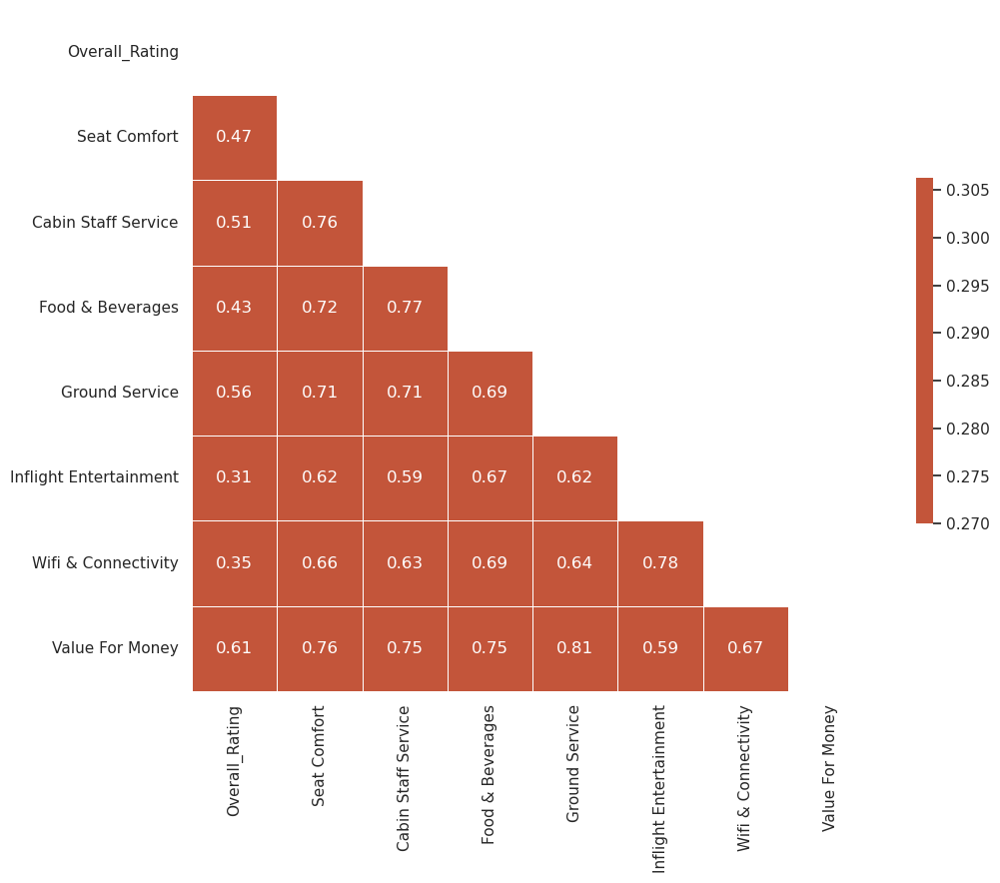

In [48]:
sns.set_theme(style="white")

# make a dataframe with only numberic variables, without 'Outcome'
d = df.drop(['Verified'], axis=1)

# Compute the correlation matrix for numeric features
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

We can find that 
- *Value For Money* has the highest correlation with *Overall_Rating* (that is, this feature is the strongest driver toward the review authors to pick one of the grades in *Overall_Rating*); therefore, it would be nice to drill into more insights on the drivers to impact *Value For Money* (although the correlation coefficient is still below 0.7, meaning the strength of correlation between these variables to be medium)
- *Overall_Rating* has medium-level correlation with *Seat Comfort, Cabin Staff Service, Food & Beverages*, and *Ground Service*
- *Value For Money* is highly correlated with grades for *Seat Comfort, Cabin Staff Service, Food & Beverages*, and *Ground Service*
- At the same time, *Value For Money* has only medium correlation with *Inflight Entertainment* and *Wifi & Connectivity* features
- *Seat Comfort, Cabin Staff Service, Food & Beverages*, and *Ground Service* features are highly correlated with each other
- *Inflight Entertainment* and *Wifi & Connectivity* are highly correlated


<div class="alert alert-block alert-info"> ✅ <b>Note</b>: As mentioned in various sources (<a href="https://www.globalnegotiator.com/international-trade/dictionary/value-money-vfm/" target="_blank">here</a> or <a href="https://www.igi-global.com/dictionary/management-of-strategic-knowledge-and-technology-in-government-agencies-for-public-value/43111" target="_blank">here</a>), <i>Value for Money (VFM)</i> is a measure of quality that is about providing services that are of the right quality, level and cost that reflect the needs and priority of citizens, taxpayers and the wider community. From that standpoint, it is justified to understand how airline passengers set their subjective views on VFM
</div>

# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">Interations with Value for Money</div>

As mentioned above, *Value for Money* is the strongest driver to correlate with *Overall_Rating*, among the numeric features (although the correlation coefficient is still below 0.7, meaning the strength of correlation between these variables to be medium). It would be nice to review the interactions of the major categorical features with *Value for Money (VFM)*. 

In [49]:
fig = make_subplots(rows=2, cols=2, subplot_titles=('<b>Relations between VFM and Recommended</b>',
                                                    '<b>Relations between VFM and Verified</b>',
                                                    '<b>Relations between VFM and Type Of Traveller</b>',
                                                    '<b>Relations between VFM and Seat Type</b>'
                                                   ))

fig.add_trace(go.Box(y=df['Value For Money'], x=df['Recommended']), row=1, col=1)
fig.add_trace(go.Box(y=df['Value For Money'], x=df['Verified']), row=1, col=2)
fig.add_trace(go.Box(y=df['Value For Money'], x=df['Type Of Traveller']), row=2, col=1)
fig.add_trace(go.Box(y=df['Value For Money'], x=df['Seat Type']), row=2, col=2)

                                
# Update visual layout
fig.update_layout(
    showlegend=False,
    width=800,
    height=400,
    autosize=False,
    margin=dict(t=15, b=0, l=5, r=5),
    template="plotly_white",
    colorway=px.colors.qualitative.Prism ,
)

# update font size at the axes
fig.update_coloraxes(colorbar_tickfont_size=10)
# Update font in the titles: Apparently subplot titles are annotations (Subplot font size is hardcoded to 16pt · Issue #985)
fig.update_annotations(font_size=12)
# Reduce opacity
fig.update_traces(opacity=0.75)

fig.show()

As we can see, there is a notable difference in VFM scores in reviews with *Recommended = 'yes'* and *Recommended = 'no'* statuses. It generally support the intuition of the reviews with *Recommended = 'yes'* to indicate more satisfied passengers, thus having higher VFM scores as a consequence.

We can also see the notable difference in VFM stats for the categories in Seat Type.

- First-Class travellers set the highest VFM ratings to their flights (median of VFM for them is 4)
- Business-Class travellers also rank their flights quite high, in terms of VFM (median of VFM for them is 3.5)
- Economy and Premium Economy class passengers have set the lowest ranks of VFM (median of VFM for them is 1)

At the same time, we do not see big differences in the VFM distribution by Type of Traveller and Verified status. There are only minimal differences there as follows
- the median value of VFM for Business and Solo Leisure travellers is a little higher (2) then for the travellers of other types (1)
- the median value for verified reviews is 1, and it is a little higher (2) for non-verified reviews

So, as we can see, only *Recommended* status has notable interaction with VFM. 

Let's compare it with the interation between Overall Rating and the same categorical variables.

In [50]:
fig = make_subplots(rows=2, cols=2, subplot_titles=('<b>Relations between Overall_Rating and Recommended</b>',
                                                    '<b>Relations between Overall_Rating and Verified</b>',
                                                    '<b>Relations between Overall_Rating and Type Of Traveller</b>',
                                                    '<b>Relations between Overall_Rating and Seat Type</b>'
                                                   ))

fig.add_trace(go.Box(y=df['Overall_Rating'], x=df['Recommended']), row=1, col=1)
fig.add_trace(go.Box(y=df['Overall_Rating'], x=df['Verified']), row=1, col=2)
fig.add_trace(go.Box(y=df['Overall_Rating'], x=df['Type Of Traveller']), row=2, col=1)
fig.add_trace(go.Box(y=df['Overall_Rating'], x=df['Seat Type']), row=2, col=2)

                                
# Update visual layout
fig.update_layout(
    showlegend=False,
    width=800,
    height=400,
    autosize=False,
    margin=dict(t=15, b=0, l=5, r=5),
    template="plotly_white",
    colorway=px.colors.qualitative.Prism ,
)

# update font size at the axes
fig.update_coloraxes(colorbar_tickfont_size=10)
# Update font in the titles: Apparently subplot titles are annotations (Subplot font size is hardcoded to 16pt · Issue #985)
fig.update_annotations(font_size=12)
# Reduce opacity
fig.update_traces(opacity=0.75)

fig.show()

As we can see, the interactions of *Overall_Rating* with the key categorical features are much stronger. It  is evident that
- median value for *Overall_Rating* in recommended review (7) is much higher then in non-recommented reviews (1)
- overall ratings in non-verified reviews are statistically higher then in the reviews verified by the review website crew
- Business travellers typically set higher *Overall_Rating* values, compared with other types of travellers
- passengers in Business Class tend to set higher *Overall_Rating* values, compared with the passengers who travelled by other seat types

# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">Airline Insights</div>

Let's analize the summary statistics for individual airlines (represented by *Airlines Name* feature).

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Number of Airlines and Reviews by Airlines</div>

In [51]:
dfg = df['Airline Name'].value_counts().reset_index()
dfg.columns = ['Airline Name', 'Quantity']
print('Number of distinct airlines in the review dataset:', dfg.shape[0])

Number of distinct airlines in the review dataset: 497


In [52]:
fig = px.bar(dfg, x='Airline Name', y='Quantity', 
             title='Quantity of Airline Reviews by Airline Names',
             #orientation='h',
            color_discrete_sequence=px.colors.qualitative.Prism) 
fig.show()

In [53]:
fig = px.histogram(dfg, x="Quantity", marginal="rug",
                   title='Distribution of Review Number by Airline Names',
                   color_discrete_sequence=px.colors.qualitative.Prism)
fig.show()

We find that

- there are reviews for *497* airlines in the dataset
- the largest number of reviews per an airline is *100* (it is observed for *155* different airlines)
- in turn, *210* airlines have less then *20* reviews per a company (such airlines do not have a good enough representative sample of reviews to compare the quality of their services with other airlines)
- *132* airlines have the number of reviews between 20 and 100

We are going to further proceed with calculating the summary statistics for the individual airlines.

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Average Metrics by Airlines</div>

Let's calculate the average values of numeric metrics in the dataset by each of the individual airlines.

In [54]:
df_agg = df.groupby("Airline Name").mean(numeric_only=True).reset_index()
df_agg

,Airline Name,Overall_Rating,Verified,Seat Comfort,Cabin Staff Service,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money
0,AB Aviation,3.666667,1.000000,2.666667,2.666667,2.000000,2.000000,NaN,NaN,2.333333
1,ANA All Nippon Airways,3.750000,0.840000,4.281250,4.604167,4.177778,4.193878,3.988235,4.125000,4.110000
2,ASKY Airlines,2.304348,0.391304,2.142857,1.857143,1.941176,1.555556,1.090909,1.000000,1.565217
3,ATA Airlines,1.500000,0.000000,1.000000,1.500000,1.500000,1.500000,NaN,NaN,2.000000
4,Adria Airways,4.087912,0.131868,3.392857,3.428571,2.627907,3.051282,1.718750,1.900000,2.538462
...,...,...,...,...,...,...,...,...,...,...
492,euroAtlantic Airways,2.062500,0.562500,1.375000,1.875000,2.307692,1.625000,1.538462,1.666667,1.437500
493,fastjet,2.878788,0.363636,3.000000,2.928571,2.125000,2.290323,1.285714,1.000000,2.272727
494,flyadeal,1.894737,0.842105,1.600000,1.666667,1.857143,1.333333,1.000000,1.000000,1.736842
495,flybe,1.250000,1.000000,3.333333,4.333333,4.500000,3.500000,NaN,NaN,3.250000


Now, let's merge the total number of reviews per airlines with the dataframe with the average numeric metrics.

In [55]:
dfg = df['Airline Name'].value_counts().reset_index()
dfg.columns = ['Airline Name', 'Review_Count']


df_summ = pd.merge(
    dfg,
    df_agg,
    how="inner",
    on='Airline Name')
df_summ.head()

,Airline Name,Review_Count,Overall_Rating,Verified,Seat Comfort,Cabin Staff Service,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money
0,Caribbean Airlines,100,3.48,0.27,2.884058,3.173913,2.936508,2.510204,2.157895,1.823529,2.53
1,GoAir,100,1.42,0.71,1.735849,1.962264,1.678571,1.500000,1.190476,1.055556,1.37
2,Germanwings,100,4.21,0.02,3.185567,2.958763,1.977778,2.666667,0.657895,1.000000,3.08
3,Philippine Airlines,100,2.65,0.78,2.382022,3.056818,2.493827,1.957447,2.253521,1.540000,2.08
4,Bangkok Airways,100,4.45,0.82,3.673684,4.105263,3.839080,3.711340,2.157895,1.857143,3.64


After it, we are ready to visualize the relations between the average *Overall_Rating* and the most correlated numeric component (that is, the average values of *Value For Money*) on the airlines summary rollup dataframe

In [56]:
fig = px.scatter(df_summ, x="Value For Money", y="Overall_Rating", 
                 color="Verified",
                 size='Review_Count', 
                 title='Airlines: Average Overall Rating by Avg Value For Money ',
                 color_continuous_scale=px.colors.sequential.BuPu,
                 hover_data=df_summ.columns)
fig.show()

We see that 

- there is a linear relation between *Overall_Rating* and *Value For Money (VFM)* (earlier, we identified these attributes to have medium-to-strong correlation)
- there is a number of 'outlier' airlines with the exceptionally high *VFM* and/or *Overall_Rating* yet without statistically significant sample of reviews (with review count less than 20)
- at the same time, we can see a few companies with statistically significant number of reviews with good average *Overall_Rating* and/or *VFM* (like *	China Southern Airlines* etc.)

Let's drill down to put together top 10 and bottom 10 lists of airlienes in terms of the highest/lowest average *Overall_Rating* and/or *VFM*. While selecting th airlines, we are going to filter out the companies with statistically small number of reviews (that is, less then 20).

In [57]:
airlines_significant_df = df_summ[df_summ['Review_Count'] >= 20]

In [58]:
airlines_significant_df.sort_values(['Overall_Rating', 'Review_Count'], 
                   ascending=False)[
                        [ 
                          'Airline Name',
                          'Overall_Rating',
                          'Review_Count'
                        ]
][:10].style.background_gradient(cmap='seismic')

,Airline Name,Overall_Rating,Review_Count
282,Druk Air,6.450000,20
80,China Southern Airlines,6.310000,100
191,Cathay Dragon,6.112903,62
251,Mahan Air,6.033333,30
72,QantasLink,5.970000,100
178,Lao Airlines,5.736111,72
193,Citilink,5.683333,60
247,Nepal Airlines,5.606061,33
48,Royal Brunei Airlines,5.520000,100
258,Myanmar Airways,5.518519,27


 We see the airlines below to constitute the top 10 list of companies with the highest average *Overall_Review* values
 
- Druk Air (average *Overall_Review* = 6.450000 based on 20 reviews)
- China Southern Airlines (average *Overall_Review* = 6.310000 based on 100 reviews)
- Cathay Dragon (average *Overall_Review* = 6.112903 based on 62 reviews)
- QantasLink (average *Overall_Review* = 5.970000 based on 100 reviews)
- Lao Airlines (average *Overall_Review* = 5.736111 based on 72 reviews)
- Citilink (average *Overall_Review* = 5.683333 based on 60 reviews)
- Nepal Airlines (average *Overall_Review* = 5.606061 based on 33 reviews)
- Royal Brunei Airlines (average *Overall_Review* = 5.520000 based on 100 reviews)
- Myanmar Airways (average *Overall_Review* = 5.518519 based on 27 reviews)

In [59]:
airlines_significant_df.sort_values(['Overall_Rating', 'Review_Count'], 
                   ascending=True)[
                        [ 
                          'Airline Name',
                          'Overall_Rating',
                          'Review_Count'
                        ]
][:10].style.background_gradient(cmap='seismic')

,Airline Name,Overall_Rating,Review_Count
182,Viva Air,1.200000,70
215,VivaColombia,1.229167,48
8,Frontier Airlines,1.230000,100
63,Spirit Airlines,1.260000,100
104,Volaris,1.270000,100
123,Interjet,1.280000,100
239,Boutique Air,1.289474,38
77,Silver Airways,1.290000,100
272,Air Juan,1.347826,23
1,GoAir,1.420000,100


We see the airlines below to constitute the bottom 10 list of the airliens in terms of the lowest average *Overall_Review* values

- Viva Air (average *Overall_Review* = 1.200000 based on 70 reviws)
- VivaColombia (average *Overall_Review* = 1.229167 based on 48 reviws)
- Frontier Airlines (average *Overall_Review* = 1.230000 based on 100 reviws)
- Spirit Airlines (average *Overall_Review* = 1.260000 based on 100 reviws)
- Volaris (average *Overall_Review* = 1.270000 based on 100 reviws)
- Interjet (average *Overall_Review* = 1.280000 based on 100 reviws)
- Boutique Air (average *Overall_Review* = 1.289474 based on 38 reviws)
- Silver Airways (average *Overall_Review* = 1.290000 based on 100 reviws)
- Air Juan (average *Overall_Review* = 1.347826 based on 23 reviws)
- GoAir (average *Overall_Review* = 1.420000 based on 100 reviws)

In [60]:
airlines_significant_df.sort_values(['Value For Money', 'Review_Count'], 
                   ascending=False)[
                        [ 
                          'Airline Name',
                          'Value For Money',
                          'Review_Count'
                        ]
][:10].style.background_gradient(cmap='seismic')

,Airline Name,Value For Money,Review_Count
36,Hainan Airlines,4.540000,100
80,China Southern Airlines,4.540000,100
83,ANA All Nippon Airways,4.110000,100
283,Air Busan,4.100000,20
251,Mahan Air,4.000000,30
207,Rex Airlines,3.980392,51
180,BA CityFlyer,3.972222,72
286,Jin Air,3.900000,20
5,Garuda Indonesia,3.880000,100
48,Royal Brunei Airlines,3.850000,100


We see that the top 10 airlines in terms of the highest average *VFM* values are

- Hainan Airlines (average *VFM* = 4.540000 based on 100 reviews)
- China Southern Airlines (average *VFM* = 4.540000 based on 100 reviews)
- ANA All Nippon Airways (average *VFM* = 4.110000 based on 100 reviews)
- Air Busan (average *VFM* = 4.100000 based on 20 reviews)
- Mahan Air (average *VFM* = 4.000000 based on 30 reviews)
- Rex Airlines (average *VFM* = 3.980392 based on 51 reviews)
- BA CityFlyer (average *VFM* = 3.972222 based on 72 reviews)
- Jin Air (average *VFM* = 3.900000 based on 20 reviews)
- Garuda Indonesia (average *VFM* = 3.880000 based on 100 reviews)
- Royal Brunei Airlines (average *VFM* = 3.850000 based on 100 reviews)

It also demonstrates the airlines below to be in both top 10 lists (by *Overall_Review* and *VFM*, respectively)

- China Southern Airlines
- Mahan Air 
- Royal Brunei Airlines

It will be intresting to do the detailed case studies of the reviews for these airlines to identify the  success factors to help these companies to provide the top-level service.

In [61]:
airlines_significant_df.sort_values(['Value For Money', 'Review_Count'], 
                   ascending=True)[
                        [ 
                          'Airline Name',
                          'Value For Money',
                          'Review_Count'
                        ]
][:10].style.background_gradient(cmap='seismic')

,Airline Name,Value For Money,Review_Count
8,Frontier Airlines,1.170000,100
272,Air Juan,1.173913,23
273,SyrianAir,1.173913,23
182,Viva Air,1.185714,70
242,TAME,1.189189,37
38,Avianca,1.250000,100
123,Interjet,1.250000,100
19,Go First,1.320000,100
104,Volaris,1.320000,100
141,Jetblue Airways,1.320000,100


We see that the bottom 10 airlines in terms of the lowerst average *VFM* values are

- Frontier Airlines (average *VFM* = 1.170000 based on 100 reviews)
- Air Juan (average *VFM* = 1.173913 based on 23 reviews)
- SyrianAir (average *VFM* = 1.173913 based on 23 reviews)
- Viva Air (average *VFM* = 1.185714 based on 70 reviews)
- TAME (average *VFM* = 1.189189 based on 37 reviews)
- Avianca (average *VFM* = 1.250000 based on 100 reviews)
- Interjet (average *VFM* = 1.250000 based on 100 reviews)
- Go First (average *VFM* = 1.320000 based on 100 reviews)
- Volaris (average *VFM* = 1.320000 based on 100 reviews)
- Jetblue Airways (average *VFM* = 1.320000 based on 100 reviews)

We can further conclude the following airlines to be in both outsider lists (by *Overall_Review* and *VFM*, respectively)

- Viva Air
- Frontier Airlines 
- Volaris
- Interjet
- Air Juan

It will be intresting to do the detailed case studies of the reviews for these airlines to identify the  factors that put these companies to the very bottom of the list, indicating their poor services.

Before we go into detailed per-airline case studies, let's look at the summmary statistics of the 'outlier' companies that 

- had exceptionally low *VFM* values by the *Overall_Rating* categories (see above)
- had exceptionally high *VFM* values by the *Overall_Rating* categories (see above)

The list of the 'outlier' airlines with the exceptionally low *VFM* values in at least one review in certain *Overall_Rating* categories is provided below

In [62]:
deviantly_low_vfm_airlines = [
'SilkAir', 'SkyWest Airlines', 'Sky Airlines',
'Xiamen Airlines', 'Uzbekistan Airways', 'Utair Aviation',
'VLM Airlines', 'TAME',
'TunisAir', 'Regional Express']

deviantly_low_df = df_summ[df_summ['Airline Name'].isin(deviantly_low_vfm_airlines)]
deviantly_low_df

,Airline Name,Review_Count,Overall_Rating,Verified,Seat Comfort,Cabin Staff Service,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money
81,SilkAir,100,5.200000,0.440000,2.919192,3.373737,2.903226,3.295918,2.235294,2.241379,2.920000
144,Xiamen Airlines,100,4.530000,0.450000,3.272727,3.386364,3.243902,2.690476,2.527027,1.545455,3.100000
162,Regional Express,87,3.057471,0.413793,3.591837,4.140000,3.522727,3.976190,0.615385,1.000000,2.942529
179,Uzbekistan Airways,72,4.222222,0.319444,2.884615,2.653846,2.745098,2.515152,1.760870,1.000000,2.861111
219,VLM Airlines,46,3.521739,0.021739,4.000000,4.800000,4.000000,3.833333,NaN,NaN,2.413043
238,SkyWest Airlines,38,4.368421,0.052632,3.000000,3.250000,1.200000,3.750000,0.750000,NaN,2.105263
242,TAME,37,1.756757,0.324324,1.500000,1.857143,1.363636,1.333333,0.888889,1.000000,1.189189
335,Utair Aviation,10,6.000000,0.000000,2.200000,1.800000,1.750000,2.666667,0.666667,NaN,2.800000


The list of the 'outlier' airlines with the exceptionally high *VFM* values in at least one review in certain *Overall_Rating* categories is provided below

In [63]:
deviantly_high_vfm_airlines = [
'Rwandair',
'XL Airways France', 'ZIPAIR'
]

deviantly_high_df = df_summ[df_summ['Airline Name'].isin(deviantly_high_vfm_airlines)]
deviantly_high_df

,Airline Name,Review_Count,Overall_Rating,Verified,Seat Comfort,Cabin Staff Service,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money
160,Rwandair,91,4.230769,0.538462,2.961039,3.181818,2.808219,2.436620,1.887097,1.875000,2.593407
169,XL Airways France,78,3.756410,0.115385,2.123077,3.136364,2.548387,2.377778,2.017544,2.153846,3.076923
209,ZIPAIR,50,2.460000,0.700000,2.850000,3.150000,2.555556,2.304348,2.176471,2.846154,2.460000


# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">Temporal View on Airline Reviews</div>

Let's do a quick time series analysis for the reviews data. 

First of all, let's aggregate the review data by review dates, to prepare the data to plot the overall reviews timeline.

In [64]:
dfg = df[['Recommended', 'review_datetime']].value_counts().reset_index()
dfg.columns = ['Recommended', 'review_datetime', 'Review_Count']
 # Set index
dfg = dfg.set_index('review_datetime')
dfg.head()

,Recommended,Review_Count
review_datetime,,
2023-07-16,no,54
2023-06-25,no,49
2023-07-26,no,48
2023-07-21,no,46
2023-07-01,no,45


Now, let's resample by month end date, using the average value of observations per day. In such a way, it will be easier to grasp on the trends and other insights from the time series data when we visualize it.

In [65]:
# Resample by month end date, avg value  of observations per day
dfg_agg = dfg.resample(rule= 'M').mean()

/tmp/ipykernel_20/1153987267.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [66]:
fig = px.line(dfg_agg, x=dfg_agg.index, y="Review_Count",
                 width=800, height=400,
                color_discrete_sequence=px.colors.qualitative.Prism)
fig.update_layout(
    title=dict(text='Airline Review: Temporal perspective', font=dict(size=30), yref='paper'),
    yaxis = dict(tickfont = dict(size=10)),
    xaxis = dict(tickfont = dict(size=7))
)
fig.update_xaxes(
    dtick="M1",
    tickformat="%b-%Y"
)
fig.show()

We find that
- the dataset contains reviews submitted between Jan 2002 and Jul 2023 (inclusive)
- there are several gaps in the time series data (Apr - Jun 2002, Jan - Feb 2003, and Dec 2005)
- there are observed several tangible breakpoints in the time series (Jan 2015, Jan 2020, and Feb 2022)
- the structural changes associated with the breakpoint of Jan 2020 can be easily corresponded with the start of COVID-19 pandemic and associated lockdowns (it resulted in the drastic shrinkage of the amount of the airflights across the globe)
- the structural changes associated with the breakpoint of Feb 2022 can be easily corresponded with the end of COVID-19 pandemic as well as the cancellation of the lockdowns across the globe
- the amount of airline reviews keeps growing exponentially since Feb 2022, making the all-time record vs. the pre-lockdown intervals prior to Jan 2020

Now let's look at how the amount of recommended and non-recommended reviews changed over time.

In [67]:
dfg = df[['Recommended', 'review_datetime']].value_counts().reset_index()
dfg.columns = ['Recommended', 'review_datetime', 'Review_Count']
fig = px.scatter(dfg, x='review_datetime', y="Review_Count", color="Recommended",
              title='Airline Review: Reviews by Time and Recommended Status',
                 width=800, height=400,
                color_discrete_sequence=px.colors.qualitative.Prism)
fig.update_xaxes(
    dtick="M1",
    tickformat="%b-%Y")
fig.show()

We find that
- the amout of negative reviews keeps prevaling since May 2017 and onward
- the amout of positive reviews predominated in Oct 2009 - May 2017 (with a few exceptional months where the amout of negative reviews was higher)
- prior to Oct 2009, negative reviews prevailed

We can clearly see the relation between the dominance of the negative reviews post-May 2017 and the global market takeover by the low-cost airlines. The amout of flights with low costs started to severely exceed the number of flights with the regular airlines. Low costers conciously lowered the service quality bar while offering extra cheap fares for their flights. People started to use the low-cost flight options on the massive scale (due to the monetary reasons) while also experiencing less satisfaction with their airline experience.

Now, let's look at the trends with the average *Overall_Rating* charts over time.

In [68]:
dfg = df[['Overall_Rating', 'review_datetime']].value_counts().reset_index()
dfg.columns = ['Overall_Rating', 'review_datetime', 'Review_Count']

fig = px.scatter(dfg, x='review_datetime', y="Review_Count", color="Overall_Rating",
              title='Airline Review: Reviews by Time and Overall Rating',
                 width=800, height=400,
                color_discrete_sequence=px.colors.qualitative.Prism,
                color_continuous_scale=px.colors.sequential.Purp)
fig.update_xaxes(
    dtick="M1",
    tickformat="%b-%Y")
fig.show()

As we can see, the trends with lowered *Overall_Rating* is coherent with the global market takeover by the low cost airlines (see more comments above).

Let's also review how *Value For Money* trends changed over time.

In [69]:
dfg = df[['Value For Money', 'review_datetime']].value_counts().reset_index()
dfg.columns = ['Value For Money', 'review_datetime', 'Review_Count']

fig = px.scatter(dfg, x='review_datetime', y="Review_Count", color="Value For Money",
              title='Airline Review: Value For Money by Time',
                 width=800, height=400,
                color_discrete_sequence=px.colors.qualitative.Prism,
                color_continuous_scale=px.colors.sequential.BuPu)
fig.update_xaxes(
    dtick="M1",
    tickformat="%b-%Y")
fig.show()

As we can see, the VFM trends post-May 2017 are clearly impacted by the global market domination of the low cost airlines.

# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">Sentiment Analysis</div>

Let's leverage the potential insights to be extracted from the review texts. We are going to do it via NLP technologies. Namely, we are going to use NLTK for

- basic NLP transformation of the review text (such a preprocessing will involve the common steps like casting everything to the lower case, removing stop words, lemmatizing the tokens etc.)
- calculating the sentiment score, using the capabilities of the built-in, pretrained sentiment analyzer called VADER (Valence Aware Dictionary and sEntiment Reasoner)

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Initializing NLTK</div>

We are going to import the necessary libraries as well as download the subset of NLTK text corpora needed in the preprocessing and sentiment scoring down the road.

In [70]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer


# download nltk corpus (first time only)
nltk.download([
"names",
"stopwords",
"vader_lexicon",
"punkt",
"wordnet"
])
#nltk.download('all')

/opt/conda/lib/python3.10/site-packages/nltk/twitter/__init__.py:20: UserWarning:

The twython library has not been installed. Some functionality from the twitter package will not be available.



[nltk_data] Downloading package names to /usr/share/nltk_data...
[nltk_data]   Package names is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /usr/share/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [71]:
# the cell below will implement the Kaggle-specific fix/workaround for NLTK's workdnet per
# https://www.kaggle.com/discussions/general/395169 and 
# https://www.kaggle.com/code/shivanimalhotra91/nlp-using-glove-embeddings

In [72]:
!unzip /usr/share/nltk_data/corpora/wordnet.zip -d /usr/share/nltk_data/corpora/

Archive:  /usr/share/nltk_data/corpora/wordnet.zip
   creating: /usr/share/nltk_data/corpora/wordnet/
  inflating: /usr/share/nltk_data/corpora/wordnet/lexnames  
  inflating: /usr/share/nltk_data/corpora/wordnet/data.verb  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.adv  
  inflating: /usr/share/nltk_data/corpora/wordnet/adv.exc  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.verb  
  inflating: /usr/share/nltk_data/corpora/wordnet/cntlist.rev  
  inflating: /usr/share/nltk_data/corpora/wordnet/data.adj  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.adj  
  inflating: /usr/share/nltk_data/corpora/wordnet/LICENSE  
  inflating: /usr/share/nltk_data/corpora/wordnet/citation.bib  
  inflating: /usr/share/nltk_data/corpora/wordnet/noun.exc  
  inflating: /usr/share/nltk_data/corpora/wordnet/verb.exc  
  inflating: /usr/share/nltk_data/corpora/wordnet/README  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.sense  
  inflating: /usr/share/nltk_data

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Review Text Preprocessing</div>

In [73]:
# create preprocess_text function
def preprocess_text(text):

    # Tokenize the text
    tokens = word_tokenize(text.lower())

    # Remove stop words
    filtered_tokens = [token for token in tokens if token not in stopwords.words('english')]


    # Lemmatize the tokens
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]

    # Join the tokens back into a string
    processed_text = ' '.join(lemmatized_tokens)
    return processed_text

start_time = dt.datetime.now()
print("Started text preprocessing at ", start_time)
df['Review'] = df['Review'].apply(preprocess_text)
end_time = dt.datetime.now()
elapsed_time = end_time - start_time
print("Finished text preprocessing at ", end_time)
print ("Text preprocessing completed. Elapsed time: ", elapsed_time)

Started text preprocessing at  2023-08-29 17:48:02.042084
Finished text preprocessing at  2023-08-29 17:54:06.285665
Text preprocessing completed. Elapsed time:  0:06:04.243581


## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Calculating the Sentiment Scores</div>

We are going to leverage VADER to calculate the sentiment scores for the airline reviews. As a result, we are going to add two new features into our dataset as follows

- *sentiment* to be a yes/no binary flag to indicate whether the review text was generally positive  (1) or not (0)
- *sentiment_score* to be a numeric value between -1 and 1, to contain the compound sentiment score calcualted by thee pre-trained VADER model

In [74]:
# create get_sentiment function
analyzer = SentimentIntensityAnalyzer()

def get_sentiment(text):
    # initialize NLTK sentiment analyzer
    
    scores = analyzer.polarity_scores(text)
    sentiment = 0
    if scores['pos'] > 0 and scores['pos'] > scores['neg']:
        sentiment = 1
    return sentiment

def get_compound_sentiment(text):
    # initialize NLTK sentiment analyzer
    analyzer = SentimentIntensityAnalyzer()
    scores = analyzer.polarity_scores(text)
    sentiment = scores['compound']
    return sentiment

start_time = dt.datetime.now()
print("Started sentiment scoring at ", start_time)
df['sentiment'] = df['Review'].apply(get_sentiment)
df['sentiment_score'] = df['Review'].apply(get_compound_sentiment)

end_time = dt.datetime.now()
elapsed_time = end_time - start_time
print("Finished sentiment scoring at ", end_time)
print ("Sentiment scoring completed. Elapsed time: ", elapsed_time)

Started sentiment scoring at  2023-08-29 17:54:06.799365
Finished sentiment scoring at  2023-08-29 17:57:05.289701
Sentiment scoring completed. Elapsed time:  0:02:58.490336


## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Sentiment Confusion</div>

Let's investigate how the sentiment of the reviews corresponds to the user setting the value to *'Recommended'* feature.

In [75]:
# transform 'Recommended' to 1/0 values to calculate confusion matrix
def set_recommended(value):
    result = 0
    if value == "yes":
        result = 1
    return result

df['recommended_binary'] = df['Recommended'].apply(set_recommended)

In [76]:
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(df['recommended_binary'], df['sentiment'])
print(cf_matrix)

[[10076  5288]
 [  504  7303]]


<Axes: >

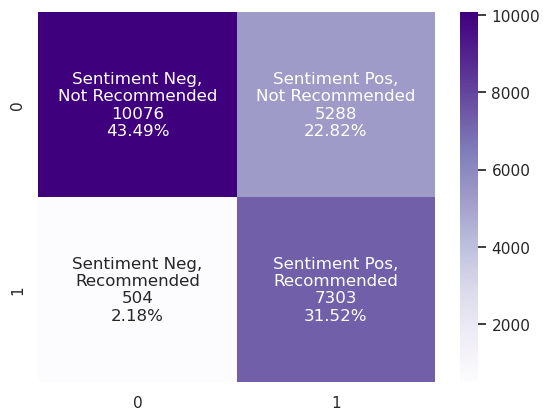

In [77]:
group_names = ["Sentiment Neg,\nNot Recommended","Sentiment Pos,\nNot Recommended","Sentiment Neg,\nRecommended","Sentiment Pos,\nRecommended"]
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Purples')

As we can see, the picture is quite counter-intuitive

- About *25%* of reviews are quite confusive (they fit into two 'confusion' categories: (1) sentimement is positive whereas the overall status was set to 'Not Recommended', or (2) sentiment is negative yet the overall status was set to 'Recommended'); it can be one more indicator of the structure of the questionnnaire on the airlines review website to be confusing to the users
- *31.52%* of the reviews are positive both in terms of their sentiment and Recommended status ('yes')
- *43.48%* of the reiews are negative both in terms of their sentiment and Recommmended status ('no')
- overall, more then *54%* of the reviews expressed the positive sentiment

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Sentiment Score Insights</div>

Let's look at the sentiment score distribution first.

In [78]:
fig = px.histogram(df, x="sentiment_score", marginal="rug",
                   title='Distribution of Sentiment Score',
                   color_discrete_sequence=px.colors.qualitative.Prism)
fig.show()

As we can see, the wast majority of the records has the positive sentiment score (*>= 0.5*). It contrasts with the earlier detected insights that the majority of the reviews has negative Recommended status (that is, *Recommended = 'no'*).

<div class="alert alert-block alert-info"> ✅ <b>Note</b>: Such a discovery can be treated as yet one more argument to prove the user confusion with the airflight review questionnaire on the AirlineQuality website. It is natural to expet that we see more reviews with Recommended = 'no' to have lower sentiment scores whereas higher sentiment scores should attribute to the reviews with Recommended = 'yes'.
</div>

In [79]:
fig = px.violin(df, y="sentiment_score", x="Overall_Rating", 
                box=True,  
                title="Sentiment Score by Overall Rating", 
                color_discrete_sequence=px.colors.qualitative.Prism,
                hover_data=['Airline Name'])
fig.show()

In [80]:
fig = make_subplots(rows=2, cols=2, subplot_titles=('<b>Relations between Sentiment Score and Recommended</b>',
                                                    '<b>Relations between Sentiment Score and Verified</b>',
                                                    '<b>Relations between Sentiment Score and Type Of Traveller</b>',
                                                    '<b>Relations between Sentiment Score and Seat Type</b>'
                                                   ))

fig.add_trace(go.Box(y=df['sentiment_score'], x=df['Recommended']), row=1, col=1)
fig.add_trace(go.Box(y=df['sentiment_score'], x=df['Verified']), row=1, col=2)
fig.add_trace(go.Box(y=df['sentiment_score'], x=df['Type Of Traveller']), row=2, col=1)
fig.add_trace(go.Box(y=df['sentiment_score'], x=df['Seat Type']), row=2, col=2)

                                
# Update visual layout
fig.update_layout(
    showlegend=False,
    width=800,
    height=400,
    autosize=False,
    margin=dict(t=15, b=0, l=5, r=5),
    template="plotly_white",
    colorway=px.colors.qualitative.Prism ,
)

# update font size at the axes
fig.update_coloraxes(colorbar_tickfont_size=10)
# Update font in the titles: Apparently subplot titles are annotations (Subplot font size is hardcoded to 16pt · Issue #985)
fig.update_annotations(font_size=12)
# Reduce opacity
fig.update_traces(opacity=0.75)

fig.show()

Now, let's check the correlation of the sentiment-related attributes with the *Overall_Rating*.

/tmp/ipykernel_20/2368451802.py:7: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

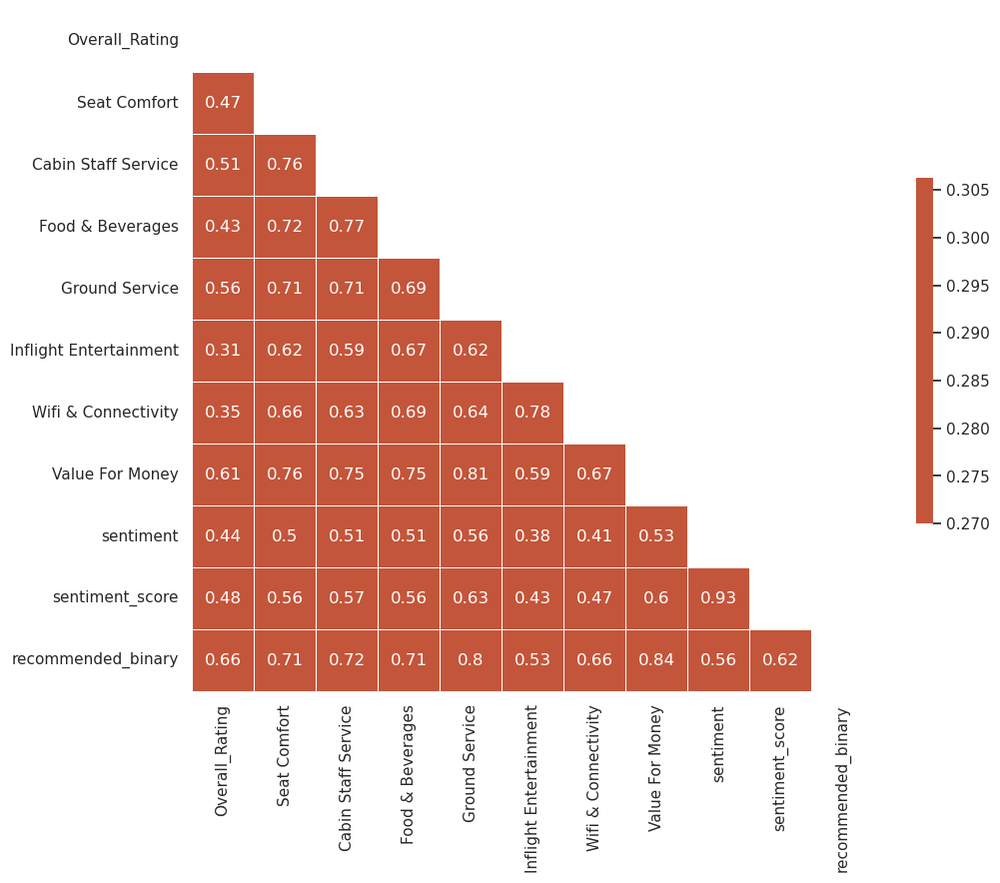

In [81]:
sns.set_theme(style="white")

# make a dataframe with only numberic variables, without 'Outcome'
d = df.drop(['Verified'], axis=1)

# Compute the correlation matrix for numeric features
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

As we can see, there  is a lack of strong correlation between the sentiment score of the reviews and the overall rating. It can be one more proof of the confusion with the review questionnaire. The naive intuition would expect to see the sentiment score to be strongly correlated with overall rating (as both parameters would be indicative of the customer satisfaction with the flight experience).

At the same time, we can see quite a medium-to-strong correlation of *sentiment_score* with 
- *Value For Money*
- *Ground Services*

# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">Airline Case Studies</div>

In this chapter, we are going to scrutinize the factors behind overall customer successes of the airlines below

- China Southern Airlines
- Mahan Air 
- Royal Brunei Airlines

As demonstrated above, these airlines are in the top 10 lists by *Overall_Review* and *VFM*, respectively.

In [82]:
# common airline-related functions
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
def generate_word_cloud(col_name, additional_stop_list):
    stopwords = set(STOPWORDS)
    stopwords.update(additional_stop_list)
    
    text = ' '.join(df_air[col_name])
    # lower max_font_size, change the maximum number of word and lighten the background:
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=100, background_color="white").generate(text)
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    
    return plt

def get_airline_summary_vs_global(airline_name):
    fig_title = ''.join(['Attributes Summary: ', airline_name, ' vs. Global Review Population'])

    fig = go.Figure()

    fig.add_bar(x=d_merged['metric'],y=d_merged['global_average'], hovertext="Total Averages", name="Global Averages", 
            marker_color=px.colors.sequential.BuPu[5])
    fig.add_bar(x=d_merged['metric'],y=d_merged['airline_average'], hovertext="Airline Averages", name="Airline Averages", 
            marker_color=px.colors.sequential.BuPu[8])

    # Update visual layout
    fig.update_layout(
        showlegend=True,
        width=800,
        height=400,
        autosize=False,
        margin=dict(t=30, b=0, l=5, r=5),
        template="plotly_white",
        yaxis_title="Average Values",
        title=dict(text=fig_title, font=dict(size=20), yref='paper')
    )

    # update font size at the axes
    fig.update_coloraxes(colorbar_tickfont_size=10)
    # Update font in the titles: Apparently subplot titles are annotations (Subplot font size is hardcoded to 16pt · Issue #985)
    fig.update_annotations(font_size=12)
    # Reduce opacity
    fig.update_traces(opacity=0.75)
    
    return fig

def get_airline_sentiment_and_vfm(airline_name):
    fig_title = ''.join([airline_name, ': Overall Rating by Sentiment Score and Value For Money'])

    fig = px.scatter(df_air, x="sentiment_score", y="Overall_Rating", 
                 color="Value For Money",
                 size='Value For Money', 
                 title=fig_title,
                 color_continuous_scale=px.colors.sequential.BuPu,
                 height=500,
                 hover_data=['Review_Title', 'Value For Money'])
    return fig

def display_sentiment_by_categories():
    fig = make_subplots(rows=2, cols=2, subplot_titles=('<b>Relations between Sentiment Score and Recommended</b>',
                                                    '<b>Relations between Sentiment Score and Verified</b>',
                                                    '<b>Relations between Sentiment Score and Type Of Traveller</b>',
                                                    '<b>Relations between Sentiment Score and Seat Type</b>'
                                                   ))

    fig.add_trace(go.Box(y=df_air['sentiment_score'], x=df_air['Recommended']), row=1, col=1)
    fig.add_trace(go.Box(y=df_air['sentiment_score'], x=df_air['Verified']), row=1, col=2)
    fig.add_trace(go.Box(y=df_air['sentiment_score'], x=df_air['Type Of Traveller']), row=2, col=1)
    fig.add_trace(go.Box(y=df_air['sentiment_score'], x=df_air['Seat Type']), row=2, col=2)

                                
    # Update visual layout
    fig.update_layout(
        showlegend=False,
        width=800,
        height=400,
        autosize=False,
        margin=dict(t=15, b=0, l=5, r=5),
        template="plotly_white",
        colorway=px.colors.qualitative.Prism ,
    )

    # update font size at the axes
    fig.update_coloraxes(colorbar_tickfont_size=10)
    # Update font in the titles: Apparently subplot titles are annotations (Subplot font size is hardcoded to 16pt · Issue #985)
    fig.update_annotations(font_size=12)
    # Reduce opacity
    fig.update_traces(opacity=0.75)
    
    return fig

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Guangzhou Pearl: China Southern Airlines</div>

Let's analize the success factors of Guangzhou-based *China Southern Airlines*.

In [83]:
airline_name = 'China Southern Airlines'
df_air = df[df["Airline Name"] == airline_name]
df_air.head()

,Airline Name,Overall_Rating,Review_Title,Verified,Review,Aircraft,Type Of Traveller,Seat Type,Route,Seat Comfort,...,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money,Recommended,review_datetime,sentiment,sentiment_score,recommended_binary
7011,China Southern Airlines,1,"""I recommend China Southern Airlines""",True,exceptional experience start finish . airline ...,A350-900,Solo Leisure,Economy Class,Guangzhou to Melbourne,5.0,...,5.0,5.0,5.0,NaN,5.0,yes,2023-07-25,1,0.9875,1
7012,China Southern Airlines,1,"""dismissive and borderline rude""",False,worst airline ever . friend booked ticket toge...,NaN,Couple Leisure,Economy Class,Paris to Melbourne via Guangzhou,4.0,...,2.0,1.0,5.0,1.0,3.0,no,2023-07-21,1,0.7015,0
7013,China Southern Airlines,1,"""very pleasant long trip""",True,would like thank china southern airline bringi...,NaN,Solo Leisure,Economy Class,Guangzhou to Toronto,4.0,...,4.0,5.0,4.0,4.0,4.0,yes,2023-07-15,1,0.9783,1
7014,China Southern Airlines,1,"""service was very good""",True,"lost boarding pas nervous . fortunately , staf...",NaN,Family Leisure,Economy Class,Guangzhou to Singapore,5.0,...,4.0,5.0,5.0,4.0,5.0,yes,2023-07-14,1,0.2023,1
7015,China Southern Airlines,7,"""seat, plane and amenities are super clean""",True,"despite 11 hr gz-akl flight time , whole exper...",Boeing 787,Solo Leisure,Business Class,Guangzhou to Auckland,4.0,...,5.0,5.0,3.0,1.0,3.0,yes,2023-07-08,1,0.9935,1


In [84]:
df_air.describe().T

,count,mean,std,min,25%,50%,75%,max
Overall_Rating,100.0,6.310000,3.535377,1.0000,1.0000,8.00000,9.000000,9.0000
Seat Comfort,99.0,4.484848,0.774117,1.0000,4.0000,5.00000,5.000000,5.0000
Cabin Staff Service,99.0,4.737374,0.615876,1.0000,5.0000,5.00000,5.000000,5.0000
Food & Beverages,98.0,4.295918,0.749009,1.0000,4.0000,4.00000,5.000000,5.0000
Ground Service,100.0,4.870000,0.613896,1.0000,5.0000,5.00000,5.000000,5.0000
Inflight Entertainment,83.0,4.228916,0.831180,1.0000,4.0000,4.00000,5.000000,5.0000
Wifi & Connectivity,27.0,3.444444,1.310705,1.0000,3.0000,4.00000,4.000000,5.0000
Value For Money,100.0,4.540000,0.657820,1.0000,4.0000,5.00000,5.000000,5.0000
sentiment,100.0,0.960000,0.196946,0.0000,1.0000,1.00000,1.000000,1.0000
sentiment_score,100.0,0.770647,0.323761,-0.8402,0.7574,0.88205,0.947025,0.9973


We can see the average values of all service rank attributes are higher for *China Southern Airlines* vs. the global averages across the population of 497 airlines represented in the reviews in this dataset.

In [85]:
d_a = df_air.describe().T.reset_index()
d_a = d_a[['index', 'mean']]

d_b = df.describe().T.reset_index()
d_b = d_b[['index', 'mean']]

d_merged = pd.merge (d_a, d_b, how='inner', on=['index'])
d_merged.columns = ['metric', 'airline_average', 'global_average']

In [86]:
fig = get_airline_summary_vs_global(airline_name)
fig.show()

The chart above indicates superior quality of services provided by *China Southern Airlines*. 

We can also see the big fraction of reviews where *Inflight Entertainment* and *Wi-Fi & Connectivity* are  ranked (ranked high, btw).

The fraction of *Recommended* reviews and reviews with the positive sentiment for *China Southern Airlines* are much higher then the averages across the entire review dataset.

In [87]:
fig = get_airline_sentiment_and_vfm(airline_name)
fig.show()

In [88]:
fig = display_sentiment_by_categories()
fig.show()

/tmp/ipykernel_20/588887445.py:7: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

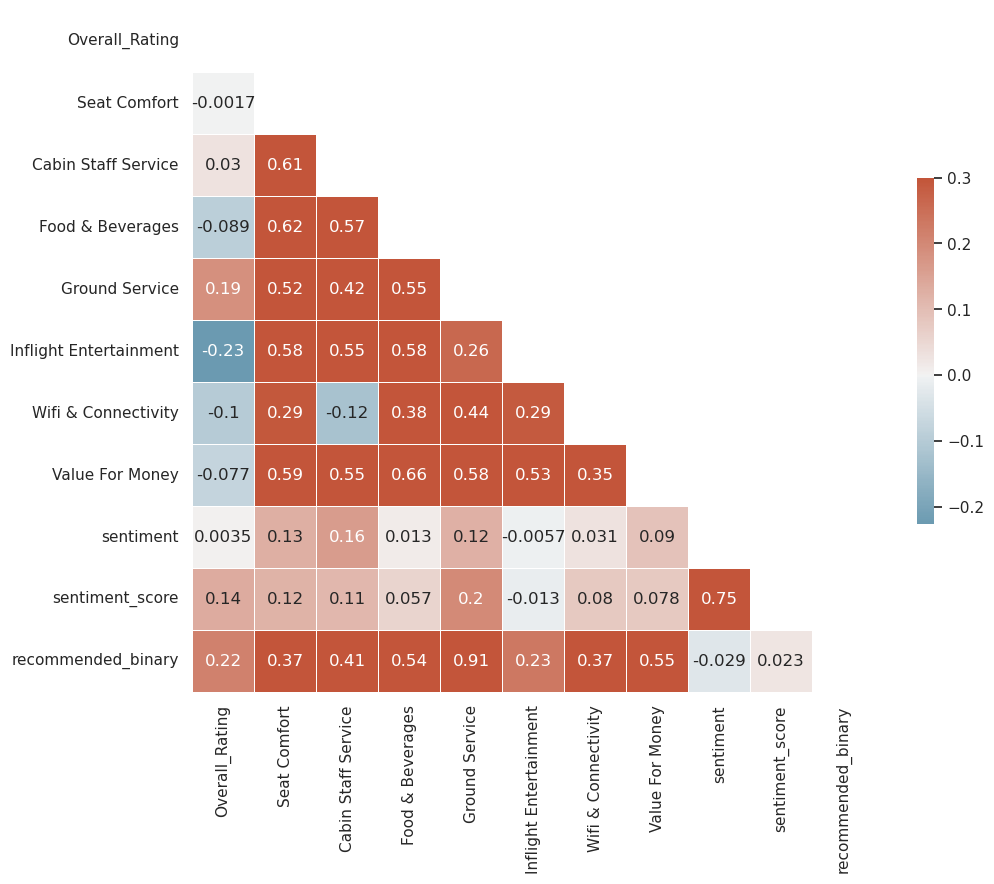

In [89]:
sns.set_theme(style="white")

# make a dataframe with only numberic variables, without 'Outcome'
d = df_air.drop(['Verified'], axis=1)

# Compute the correlation matrix for numeric features
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

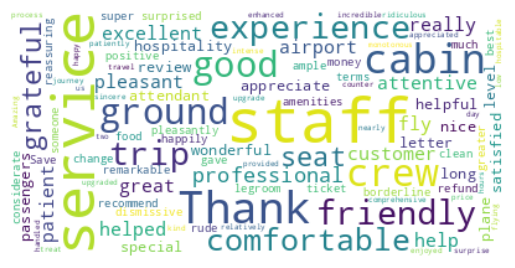

In [90]:
specific_stop_list = ['China', 'Southern', 'Airlines', 'flight', 'airline']

plt = generate_word_cloud('Review_Title', specific_stop_list)
plt.show()

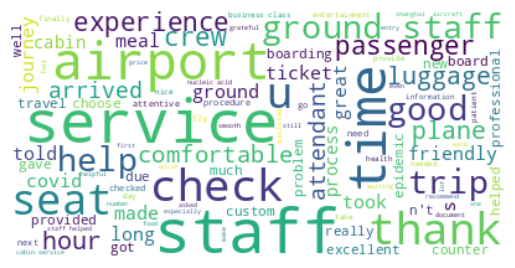

In [91]:
specific_stop_list = ['China', 'Southern', 'Airlines', 'flight', 'airline', 'guangzhou']

plt = generate_word_cloud('Review', specific_stop_list)
plt.show()

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Tehran-Based Service Leader: Mahan Air</div>

In [92]:
airline_name = 'Mahan Air'
df_air = df[df["Airline Name"] == airline_name]
df_air.head()

,Airline Name,Overall_Rating,Review_Title,Verified,Review,Aircraft,Type Of Traveller,Seat Type,Route,Seat Comfort,...,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money,Recommended,review_datetime,sentiment,sentiment_score,recommended_binary
14366,Mahan Air,9,"""Felt like flying in the old days""",True,felt like flying old day . flew one hour fligh...,A310,Business,Economy Class,Kerman to Tehran,4.0,...,5.0,4.0,3.0,NaN,5.0,yes,2022-10-30,1,0.9623,1
14367,Mahan Air,9,"""The service and amenities were unbelievable f...",False,"tehran lounge really good , free high-speed wi...",A310,Business,Business Class,Tehran (Mehrabad) to Kerman,5.0,...,5.0,5.0,3.0,1.0,5.0,yes,2021-10-19,1,0.9954,1
14368,Mahan Air,1,"""efficient, helpful and friendly""",True,shanghai barcelona via tehran mahan air busine...,A340-600 / A340-300,Family Leisure,Business Class,Shanghai to Barcelona via Tehran,5.0,...,5.0,5.0,1.0,NaN,5.0,yes,2019-01-02,1,0.9909,1
14369,Mahan Air,9,"""best airline in Iran""",True,tehran dubai . mahan air best airline iran . b...,NaN,Family Leisure,Business Class,Tehran to Dubai,5.0,...,5.0,5.0,3.0,NaN,5.0,yes,2018-08-31,1,0.9246,1
14370,Mahan Air,2,Mahan Air customer review,True,barcelona bangkok via tehran . cabin attendant...,NaN,Couple Leisure,Economy Class,Barcelona to Bangkok via Tehran,2.0,...,3.0,4.0,NaN,NaN,2.0,no,2018-08-03,0,-0.8360,0


In [93]:
df_air.describe().T

,count,mean,std,min,25%,50%,75%,max
Overall_Rating,30.0,6.033333,3.178411,1.0000,3.000000,8.0000,9.00000,9.0000
Seat Comfort,16.0,4.125000,1.360147,0.0000,4.000000,4.5000,5.00000,5.0000
Cabin Staff Service,16.0,4.062500,1.481834,0.0000,4.000000,4.5000,5.00000,5.0000
Food & Beverages,16.0,4.187500,1.327592,0.0000,4.000000,5.0000,5.00000,5.0000
Ground Service,12.0,4.416667,0.514929,4.0000,4.000000,4.0000,5.00000,5.0000
Inflight Entertainment,14.0,2.785714,1.423893,0.0000,2.000000,3.0000,3.75000,5.0000
Wifi & Connectivity,1.0,1.000000,NaN,1.0000,1.000000,1.0000,1.00000,1.0000
Value For Money,30.0,4.000000,1.313064,0.0000,4.000000,4.0000,5.00000,5.0000
sentiment,30.0,0.933333,0.253708,0.0000,1.000000,1.0000,1.00000,1.0000
sentiment_score,30.0,0.734723,0.464436,-0.8883,0.734925,0.9114,0.96805,0.9954


In [94]:
d_a = df_air.describe().T.reset_index()
d_a = d_a[['index', 'mean']]

d_b = df.describe().T.reset_index()
d_b = d_b[['index', 'mean']]

d_merged = pd.merge (d_a, d_b, how='inner', on=['index'])
d_merged.columns = ['metric', 'airline_average', 'global_average']

In [95]:
fig = get_airline_summary_vs_global(airline_name)
fig.show()

In [96]:
fig = get_airline_sentiment_and_vfm(airline_name)
fig.show()

In [97]:
fig = display_sentiment_by_categories()
fig.show()  

/tmp/ipykernel_20/588887445.py:7: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

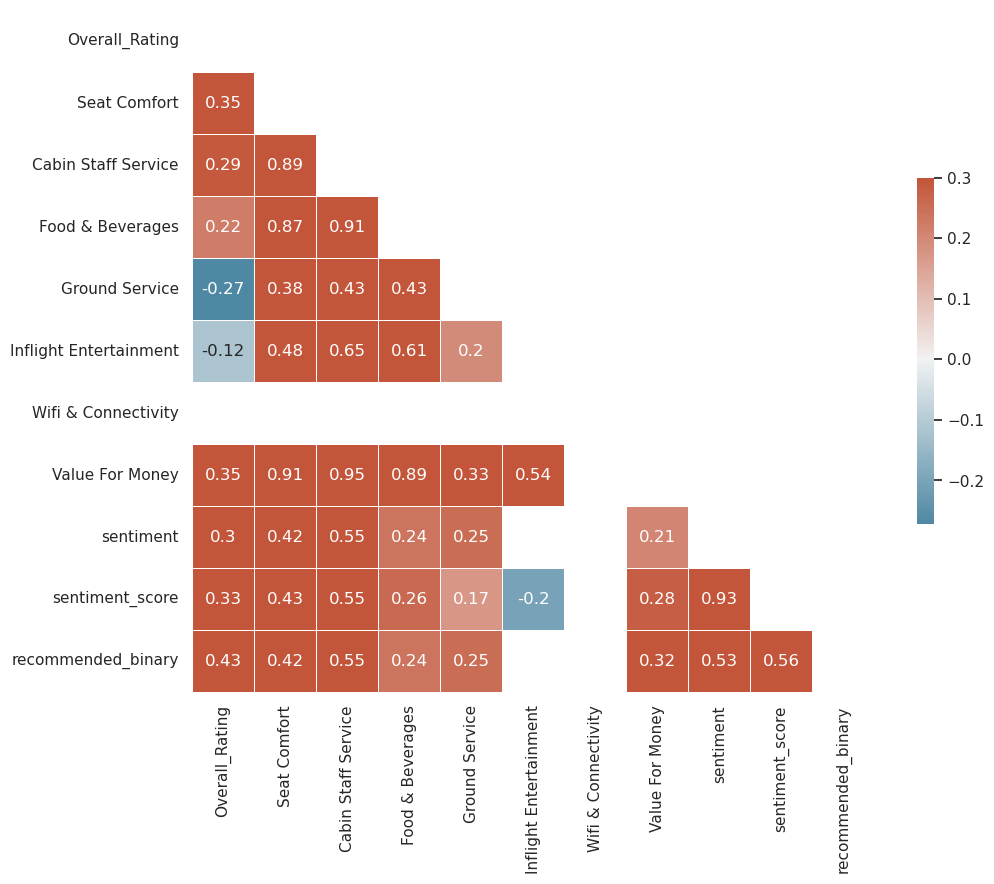

In [98]:
sns.set_theme(style="white")

# make a dataframe with only numberic variables, without 'Outcome'
d = df_air.drop(['Verified'], axis=1)

# Compute the correlation matrix for numeric features
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

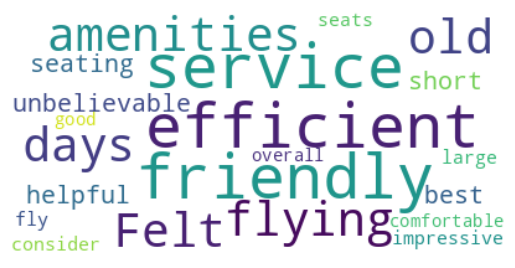

In [99]:
specific_stop_list = ['Mahan', 'Air', 'Tehran', 'flight', 'airline', 'review', 'customer', 'Iran']

plt = generate_word_cloud('Review_Title', specific_stop_list)
plt.show()

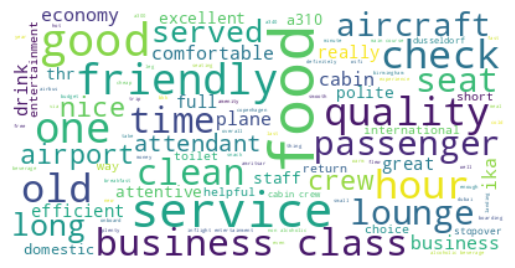

In [100]:
specific_stop_list = ['Mahan', 'Air', 'Tehran', 'Teheran', 'flight', 'airline', 'review', 
                      'customer', 'Iran', 'iranian', 'bangkok']

plt = generate_word_cloud('Review', specific_stop_list)
plt.show()

## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">Attemped Royal Services: Royal Brunei Airlines</div>

In [101]:
airline_name = 'Royal Brunei Airlines'
df_air = df[df["Airline Name"] == airline_name]
df_air.head()

,Airline Name,Overall_Rating,Review_Title,Verified,Review,Aircraft,Type Of Traveller,Seat Type,Route,Seat Comfort,...,Food & Beverages,Ground Service,Inflight Entertainment,Wifi & Connectivity,Value For Money,Recommended,review_datetime,sentiment,sentiment_score,recommended_binary
16957,Royal Brunei Airlines,7,"""a good value option""",False,flew three flight melbourne london . standard ...,Boeing 787-8 Dreamliner,Couple Leisure,Economy Class,Melbourne to London via Brunei,3.0,...,4.0,4.0,2.0,NaN,4.0,yes,2023-07-05,1,0.1620,1
16958,Royal Brunei Airlines,9,"""Good flight overall""",True,good flight overall . one cheaper option fly d...,Boeing 787-8 Dreamliner,Couple Leisure,Economy Class,Dubai to London Heathrow,5.0,...,5.0,2.0,4.0,NaN,5.0,yes,2023-07-03,0,0.1226,1
16959,Royal Brunei Airlines,9,"""Chaotic boarding at Brunei airport""",True,"chaotic boarding brunei airport , even though ...",Boeing 787-8,Couple Leisure,Economy Class,Brunei to Dubai,4.0,...,4.0,2.0,4.0,NaN,4.0,yes,2023-07-03,0,-0.5255,1
16960,Royal Brunei Airlines,9,"""Great flight from start to finish""",True,great flight start finish . online check-in wo...,A320neo,Family Leisure,Economy Class,Kuching to Bandar Seri Begawan,5.0,...,5.0,4.0,2.0,NaN,4.0,yes,2023-07-03,1,0.7783,1
16961,Royal Brunei Airlines,7,"""Unpleasant check-in experience""",True,"unpleasant check-in experience , really spoile...",Boeing 787-8,Couple Leisure,Economy Class,London Heathrow to Dubai,4.0,...,4.0,1.0,4.0,NaN,4.0,yes,2023-07-03,1,0.9321,1


In [102]:
df_air.describe().T

,count,mean,std,min,25%,50%,75%,max
Overall_Rating,100.0,5.520000,3.211344,1.0000,2.0000,6.50000,9.000000,9.0000
Seat Comfort,98.0,3.806122,1.215520,1.0000,3.0000,4.00000,5.000000,5.0000
Cabin Staff Service,98.0,3.948980,1.349856,1.0000,3.0000,5.00000,5.000000,5.0000
Food & Beverages,97.0,3.587629,1.272731,1.0000,3.0000,4.00000,5.000000,5.0000
Ground Service,96.0,3.541667,1.479094,1.0000,2.0000,4.00000,5.000000,5.0000
Inflight Entertainment,93.0,3.290323,1.290270,1.0000,2.0000,4.00000,4.000000,5.0000
Wifi & Connectivity,14.0,3.214286,1.423893,1.0000,2.2500,4.00000,4.000000,5.0000
Value For Money,100.0,3.850000,1.445124,1.0000,3.0000,5.00000,5.000000,5.0000
sentiment,100.0,0.820000,0.386123,0.0000,1.0000,1.00000,1.000000,1.0000
sentiment_score,100.0,0.571377,0.646037,-0.9686,0.4945,0.91285,0.967475,0.9925


In [103]:
d_a = df_air.describe().T.reset_index()
d_a = d_a[['index', 'mean']]

d_b = df.describe().T.reset_index()
d_b = d_b[['index', 'mean']]

d_merged = pd.merge (d_a, d_b, how='inner', on=['index'])
d_merged.columns = ['metric', 'airline_average', 'global_average']

In [104]:
fig = get_airline_summary_vs_global(airline_name)
fig.show()

In [105]:
fig = get_airline_sentiment_and_vfm(airline_name)
fig.show()

In [106]:
fig = display_sentiment_by_categories()
fig.show() 

/tmp/ipykernel_20/588887445.py:7: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

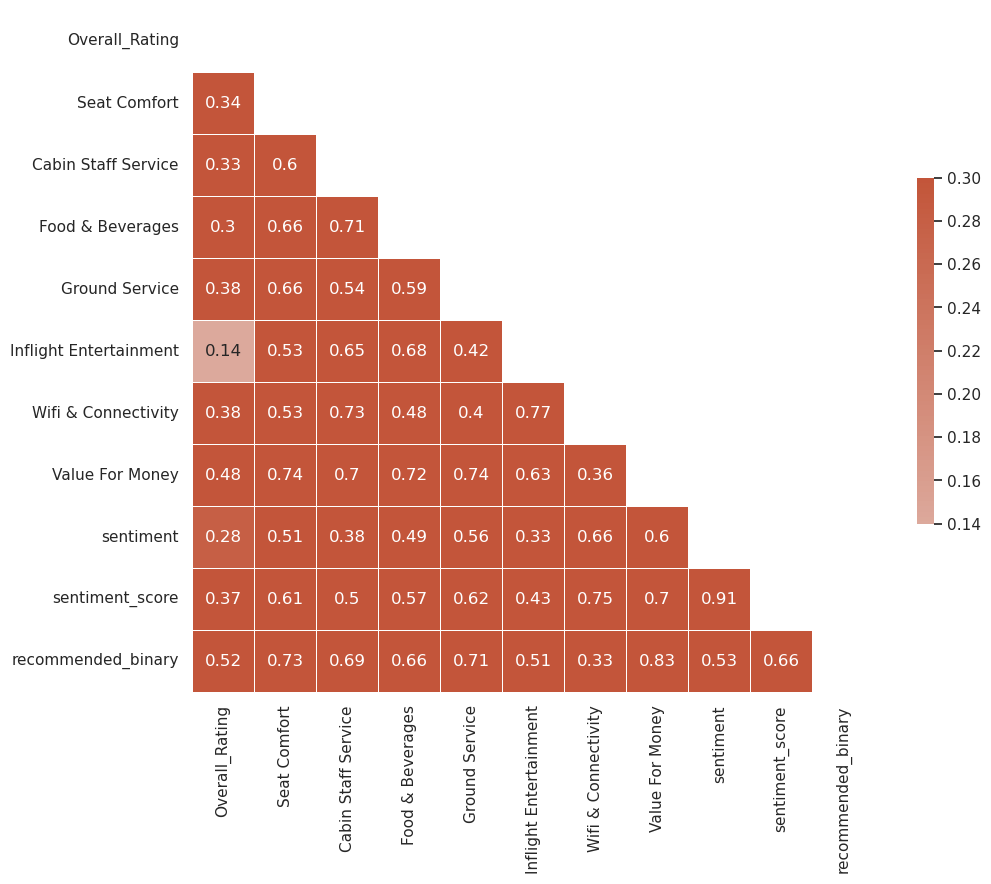

In [107]:
sns.set_theme(style="white")

# make a dataframe with only numberic variables, without 'Outcome'
d = df_air.drop(['Verified'], axis=1)

# Compute the correlation matrix for numeric features
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

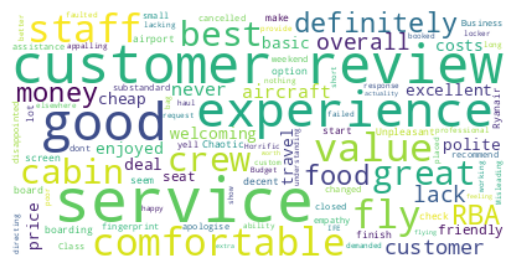

In [108]:
specific_stop_list = ["Airlines", "Brunei", "Royal", "Airlines", "flight", "airline"]

plt = generate_word_cloud('Review_Title', specific_stop_list)
plt.show()

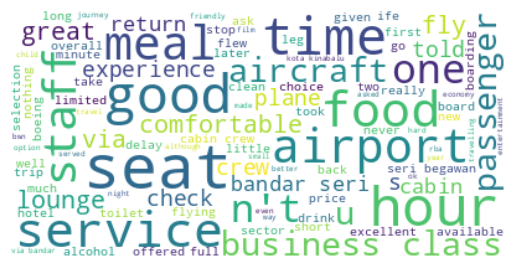

In [109]:
specific_stop_list = ["Airlines", "Brunei", "Royal", "Airlines", "flight", "airline", "dubai", 
                      "melbourne", "london", "bangkok"]

plt = generate_word_cloud('Review', specific_stop_list)
plt.show()

# <div style="color:white;background-color:#1d1545;padding:3%;border-radius:50px 50px;font-size:1em;text-align:center">References</div>

- https://en.wikipedia.org/wiki/Low-cost_carrier#History
- https://plotly.com/python/builtin-colorscales/
- https://plotly.com/python/discrete-color/#discrete-color-with-plotly-express
- https://www.datacamp.com/tutorial/text-analytics-beginners-nltk
- https://realpython.com/python-nltk-sentiment-analysis/
- https://towardsdatascience.com/getting-started-with-breakpoints-analysis-in-python-124471708d38